In [24]:
import xarray as xr                                                                                                               
import pandas as pd                                                                                                                                                                                                             
import os                                                                                                                         
from glob import glob                                                                                                             
import numpy as np                                                                                                                                                                                                    
from matplotlib import pyplot as plt                                                                                              
from datetime import datetime                                                                                                                                                                        
import pandas as pd                                                                                                                                                                                                                                                                                                            
from datetime import datetime,date,timedelta                                                                                      
import copy
from scipy.stats import pearsonr

%matplotlib inline

In [4]:
data = xr.open_zarr('/home/sebastien/projects/Dev_SS/data/tmp/moana_coast_30h_skew_surge.zarr')

In [5]:
javi_points = np.unique( # closest Moana v2 Hindcast to tidal gauges
    sorted([ 689,328,393,1327,393,480,999,116,224,1124,949,708, # UHSLC
      1296,378,1124,780,613,488,1442,1217,578,200,1177,1025,689,949,224,1146, # LINZ
      1174,1260,1217,744,1064,1214,803,999 # OTHER (ports...)
    ]))

Generates the main plots

No handles with labels found to put in legend.


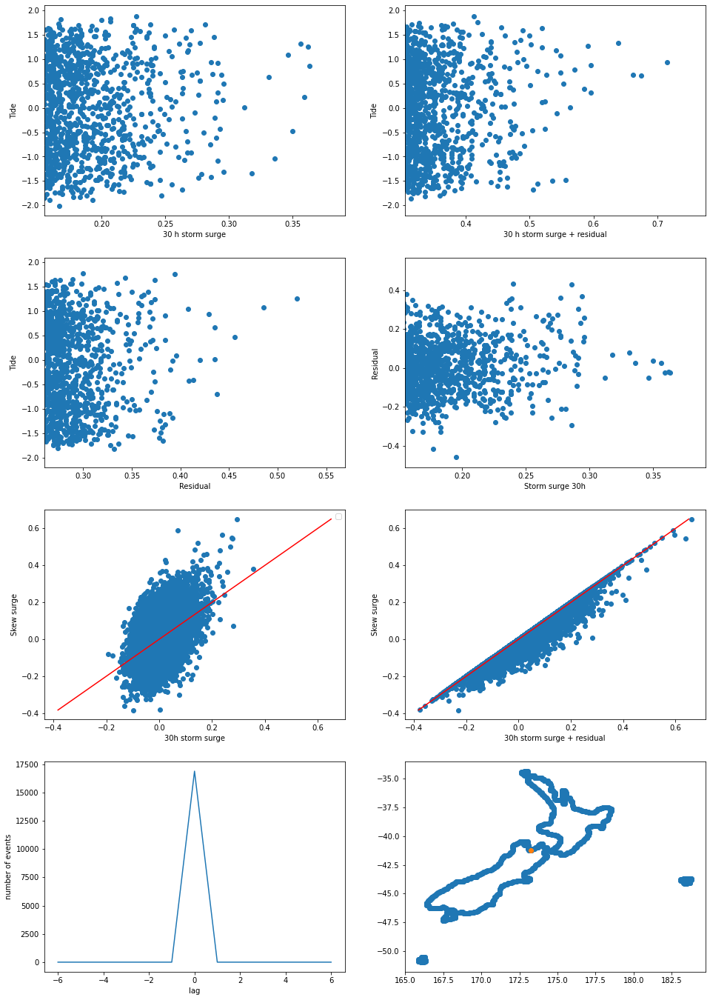

In [9]:
def do_plot(data_in, site_id, filename=None):
    data = data_in.sel(site=site_id)


    hourly_skew_surge_magitude = data.skew_surge_magnitude.squeeze().dropna(dim='time')

    hourly_skew_surge_lag = data.skew_surge_lag.squeeze().dropna(dim='time').astype(int)

    time_index =  np.intersect1d(
            pd.to_datetime(hourly_skew_surge_magitude.dropna(dim='time').time.values).round('H'),
            #pd.to_datetime(data.skew_surge_magnitude.dropna(dim='time').time.values).round('H'),
            pd.to_datetime(data.ss.dropna(dim='time').time.values).round('H'),
            return_indices=True
        )

    fig, axes = plt.subplots(ncols=2, nrows=4, figsize=(16,24))

    axes[0,0].scatter(data.ss.drop_duplicates(dim='time').squeeze(),
        data.tide.drop_duplicates(dim='time').squeeze())

    axes[0,0].set_xlabel('30 h storm surge')
    axes[0,0].set_ylabel('Tide')
    axes[0,0].set_xlim(xmin=data.ss.chunk(dict(time=-1)).drop_duplicates(dim='time').squeeze().quantile(0.995).values)

    axes[0,1].scatter((data.ss+data.res).drop_duplicates(dim='time').squeeze(),
        data.tide.drop_duplicates(dim='time').squeeze())

    axes[0,1].set_ylabel('Tide')
    axes[0,1].set_xlabel('30 h storm surge + residual')
    axes[0,1].set_xlim(xmin=(data.ss+data.res).chunk(dict(time=-1)).drop_duplicates(dim='time').squeeze().quantile(0.995).values)



    axes[1,0].scatter(data.res.drop_duplicates(dim='time').squeeze(),
        data.tide.drop_duplicates(dim='time').squeeze())

    axes[1,0].set_xlabel('Residual')
    axes[1,0].set_ylabel('Tide')
    axes[1,0].set_xlim(xmin=data.res.chunk(dict(time=-1)).drop_duplicates(dim='time').squeeze().quantile(0.995).values)

    axes[1,1].scatter((data.ss).drop_duplicates(dim='time').squeeze(),
        data.res.drop_duplicates(dim='time').squeeze())

    axes[1,1].set_xlabel('Storm surge 30h')
    axes[1,1].set_ylabel('Residual')
    axes[1,1].set_xlim(xmin=(data.ss).chunk(dict(time=-1)).drop_duplicates(dim='time').squeeze().quantile(0.995).values)


    vmax = max(data.ss.max(), hourly_skew_surge_magitude.max())
    vmin = min(data.ss.min(), hourly_skew_surge_magitude.min())

    

    axes[2,0].scatter(data.ss.drop_duplicates(dim='time').sel(time=time_index[0]).squeeze(),
                hourly_skew_surge_magitude.drop_duplicates(dim='time').sel(time=time_index[0]).squeeze())
    axes[2,0].plot([vmin, vmax], [vmin, vmax], color='red')
    axes[2,0].set_xlabel('30h storm surge')
    axes[2,0].set_ylabel('Skew surge')
    axes[2,0].legend()

    axes[2,1].scatter(data.ss.drop_duplicates(dim='time').sel(time=time_index[0]).squeeze()+data.res.drop_duplicates(dim='time').sel(time=time_index[0]).squeeze(),
                hourly_skew_surge_magitude.drop_duplicates(dim='time').sel(time=time_index[0]).squeeze())
    axes[2,1].plot([vmin, vmax], [vmin, vmax], color='red')
    axes[2,1].set_xlabel('30h storm surge + residual')
    axes[2,1].set_ylabel('Skew surge')

    axes[3,0].plot([i for i in range(-6,7)], [np.sum(hourly_skew_surge_lag==i) for i in range(-6,7)])
    axes[3,0].set_xlabel('lag')
    axes[3,0].set_ylabel('number of events')

    axes[3,1].scatter(data_in.lon.values, data_in.lat.values, color='red')
    axes[3,1].scatter([data.lon.values],[data.lat.values])
    
    if filename:
        plt.savefig(filename)

site_id=708
do_plot(data_in=data,
        site_id=site_id,#59,
        filename='/tmp/ss/ss_%i.png'%(site_id))

In [ ]:
for site_id in javi_points:
    do_plot(data_in=data,
            site_id=site_id,
            filename='/tmp/ss/ss_%i.png'%(site_id))

Here we look at the correlation between the skey surge and the storm surge

In [25]:
pearson = []
sites = []
lons = []
lats = []
for site_id in data.site.values:#data.site.values:
    data_in = data.isel(site=site_id)


    hourly_skew_surge_magitude = data_in.skew_surge_magnitude.drop_duplicates(dim='time').squeeze().dropna(dim='time')
    ss = data_in.ss.drop_duplicates(dim='time').dropna(dim='time')

    time_index =  np.intersect1d(
            pd.to_datetime(hourly_skew_surge_magitude.time.values).round('H'),
            #pd.to_datetime(data.skew_surge_magnitude.dropna(dim='time').time.values).round('H'),
            pd.to_datetime(ss.time.values).round('H'),
            return_indices=True
        )

    try:
        pp = pearsonr(hourly_skew_surge_magitude.sel(time=time_index[0]).squeeze().values,
              ss.sel(time=time_index[0]).squeeze().values)[0]
        pearson.append(pp)
        sites.append(site_id)
        lons.append(float(data_in.lon.squeeze().values))
        lats.append(float(data_in.lat.squeeze().values))
    except:
        pass

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

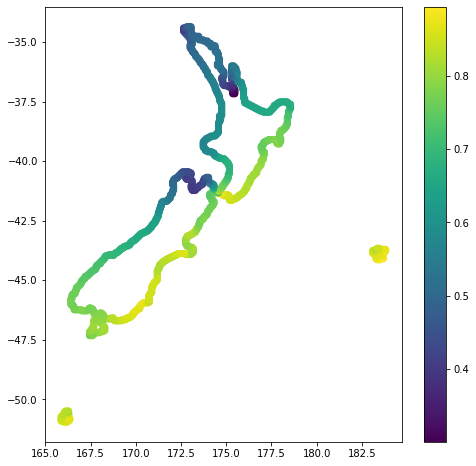

In [27]:
fig, axes = plt.subplots(ncols=1, figsize=(8,8))
c0 = axes.scatter(lons, lats, c=pearson)
#c1 = axes[1].scatter(lons, lats, c=[t[0] for t in tide_res_correlation])
#axes[1].set_colorbar()
fig.colorbar(c0, ax=axes)
#fig.colorbar(c1, ax=axes[1])
plt.savefig('/home/sebastien/Pictures/ss_correlation.png')

Here we look at a subset of the data to get an idea of the impact of the residuals

In [15]:
datasub = data.isel(site=59).sel(time=slice(datetime(1995,1,1), datetime(1995,1,15)))

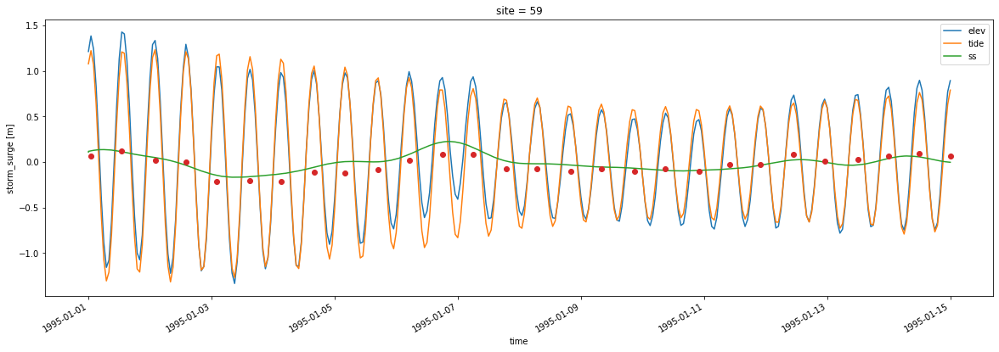

In [16]:
plt.figure(figsize=(20,6))
datasub.elev.plot(label='elev')
datasub.tide.plot(label='tide')
datasub.ss.plot(label='ss')

plt.plot(datasub.skew_surge_magnitude.dropna(dim='time').time, datasub.skew_surge_magnitude.squeeze().dropna(dim='time'),'o')
plt.legend()

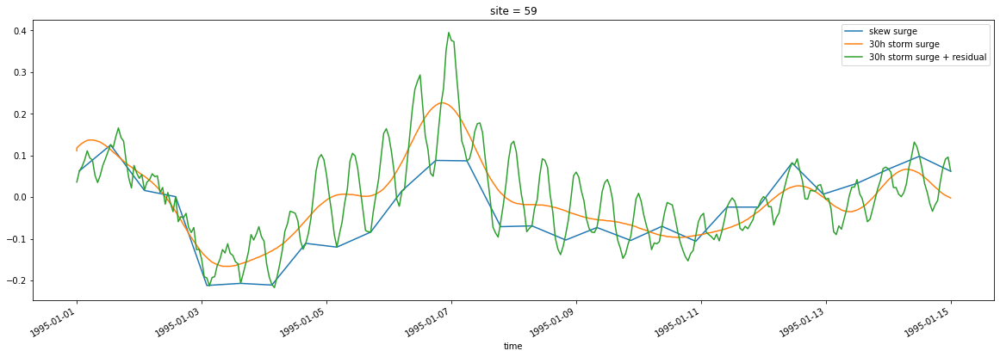

In [18]:
plt.figure(figsize=(20,6))
datasub.skew_surge_magnitude.squeeze().dropna(dim='time').plot(label='skew surge')
datasub.ss.squeeze().dropna(dim='time').plot(label='30h storm surge')
(datasub.ss+datasub.res).squeeze().dropna(dim='time').plot(label='30h storm surge + residual')
plt.legend()

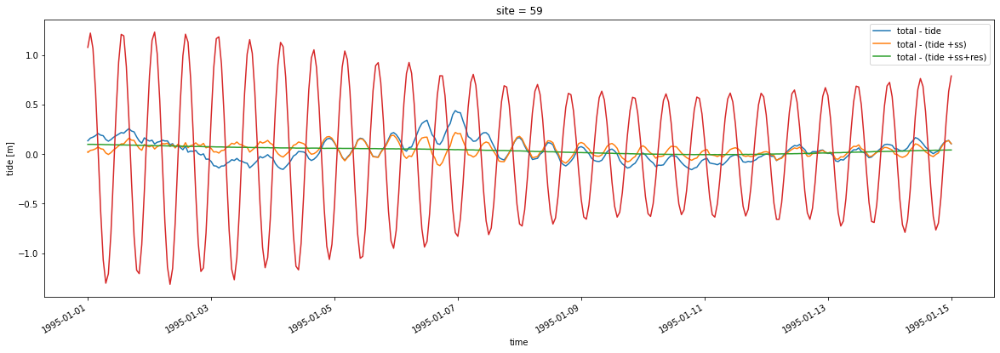

In [19]:
plt.figure(figsize=(20,6))
(datasub.elev - datasub.tide).squeeze().plot(label='total - tide')

(datasub.elev - (datasub.ss+datasub.tide)).squeeze().plot(label='total - (tide +ss)')
(datasub.elev - (datasub.ss+datasub.tide+datasub.res)).squeeze().plot(label='total - (tide +ss+res)')

datasub.tide.squeeze().plot()

plt.legend()

In [135]:
from scipy import optimize
from scipy.signal import find_peaks

We take a tidal cycle

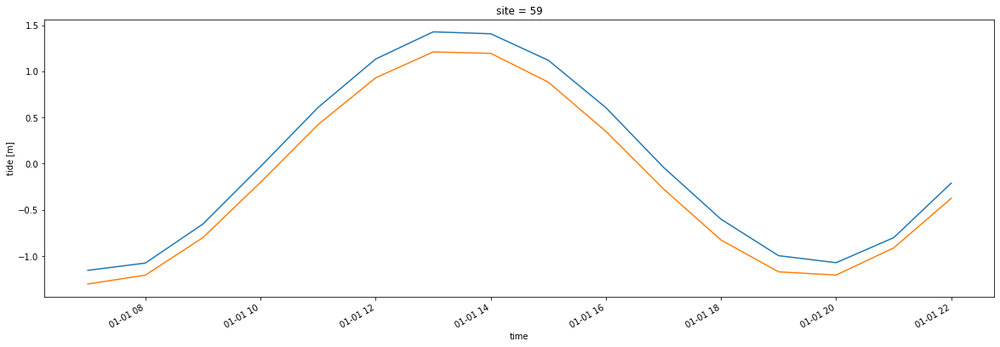

In [32]:
plt.figure(figsize=(20,6))
datasub.elev[8:24].plot()
datasub.tide[8:24].plot()

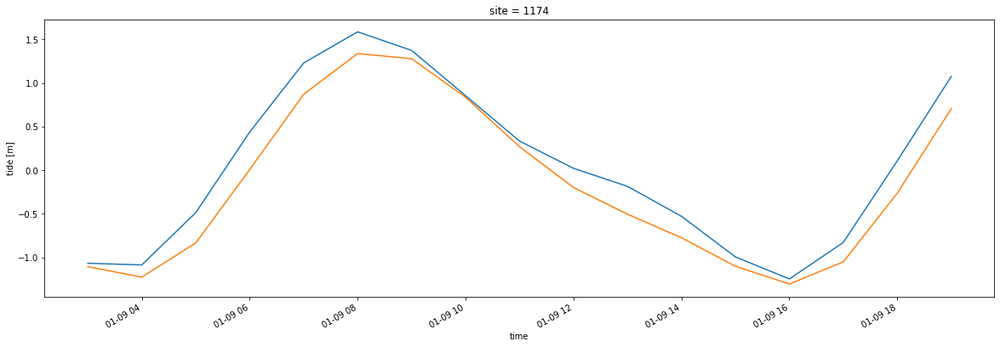

In [210]:
data_in = data.sel(site=1174).sel(time=slice(datetime(2000,1,9), datetime(2000,1,10)))
plt.figure(figsize=(20,6))
data_in.elev[3:20].plot()
data_in.tide[3:20].plot()

In [217]:
# Bounds are to find fit parameters in a narrower range    
bounds=([data_in.elev[3:20].max().values-0.2, 10, 4,-0.5],[data_in.elev[3:20].max().values+0.2, 14, 8,0.5])
pelev, covariance = optimize.curve_fit(cosine, range(len(data_in.elev[3:20])),
                                       data_in.elev[3:20].values, bounds=bounds)

bounds=([data_in.tide[3:20].max().values-0.4, 9, 2,-0.5],[data_in.tide[3:20].max().values+0.4, 15, 10,0.5])
ptide, covariance = optimize.curve_fit(cosine, range(len(data_in.time[3:20])),
                                       data_in.tide[3:20].values, bounds=bounds)
pelev[2], ptide[2], pelev[2]/pelev[1]-ptide[2]/ptide[1]

(6.700351826047669, 6.436884419767498, 0.0172580724452851)

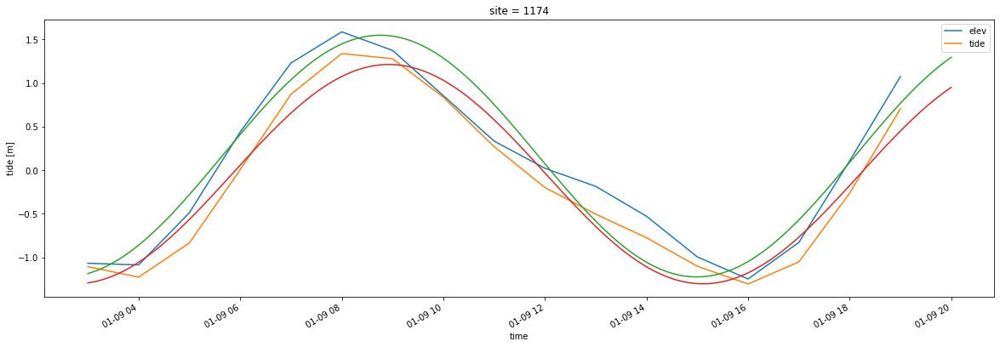

In [216]:
plt.figure(figsize=(20,6))
data_in.elev[3:20].plot(label='elev')
data_in.tide[3:20].plot(label='tide')

plt.plot(pd.date_range(data_in.time.values[3], data_in.time.values[20], periods=len(np.arange(0 , len(data_in.time[3:20])+0.1, 0.1))),
         cosine(np.arange(0 , len(data_in.time[3:20])+0.1, 0.1), *pelev))

plt.plot(pd.date_range(data_in.time.values[3],
                       data_in.time.values[20],
                       periods=len(np.arange(0 , len(data_in.time[3:20])+0.1, 0.1))),
         cosine(np.arange(0 , len(data_in.time[3:20])+0.1, 0.1), *ptide))

plt.legend()

We define a cosine function that we want to fit to the tides and to the total water elevation.
That should allow us to calculate the phase lag and the time between the tidal period with a higher resolution than just relying on the hourly data

In [201]:
def cosine(t, amplitude, period, phase,offset):
    return amplitude*np.cos(2*np.pi*((t+phase)/period))+offset
    
# Bounds are to find fit parameters in a narrower range    
bounds=([datasub.elev[8:24].max().values-0.2, 10, 4,-0.5],[datasub.elev[8:24].max().values+0.2, 14, 8,0.5])
pelev, covariance = optimize.curve_fit(cosine, range(len(datasub.elev[8:24])),
                                       datasub.elev[8:24].values, bounds=bounds)

bounds=([datasub.tide[8:24].max().values-0.2, 10, 4,-0.5],[datasub.tide[8:24].max().values+0.2, 14, 8,0.5])
ptide, covariance = optimize.curve_fit(cosine, range(len(datasub.time[8:24])),
                                       datasub.tide[8:24].values, bounds=bounds)
pelev[2], ptide[2], pelev[2]/pelev[1]-ptide[2]/ptide[1]

(5.8409071629259115, 5.84763764016235, -0.002321535021730936)

Just to check, we plot the data and the fits

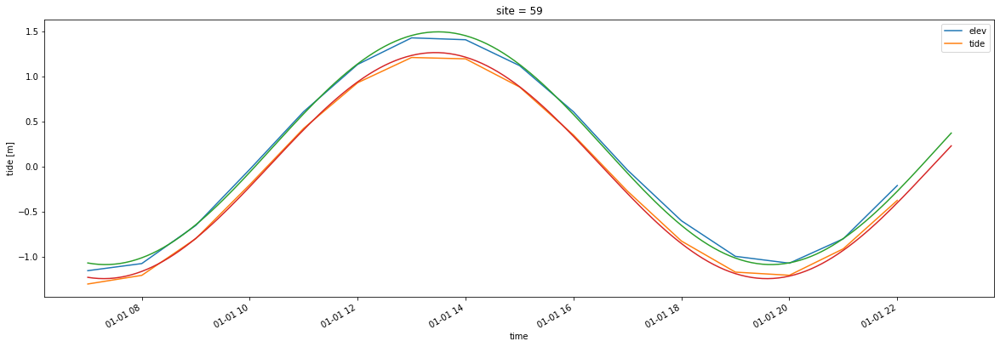

In [138]:
plt.figure(figsize=(20,6))
datasub.elev[8:24].plot(label='elev')
datasub.tide[8:24].plot(label='tide')

plt.plot(pd.date_range(datasub.time.values[8], datasub.time.values[24], periods=len(np.arange(0 , len(datasub.time[8:24])+0.1, 0.1))),
         cosine(np.arange(0 , len(datasub.time[8:24])+0.1, 0.1), *pelev))

plt.plot(pd.date_range(datasub.time.values[8],
                       datasub.time.values[24],
                       periods=len(np.arange(0 , len(datasub.time[8:24])+0.1, 0.1))),
         cosine(np.arange(0 , len(datasub.time[8:24])+0.1, 0.1), *ptide))

plt.legend()

Here we find a tidal period of 12.29 hours and a very small lag

In [139]:
ptide[1], pelev[2]-ptide[2]

(12.287981688276417, -0.0067304772364389365)

Now we can extend the analysis to a longer timeseries

In [183]:
troughs = find_peaks(-datasub.tide.values)[0]
for it0,it1 in zip(troughs[:-1],troughs[1:]):
    it1 = min(it1+6, len(datasub.tide.values)-1)
    
    if (datasub.time[it1]-datasub.time[it0]).values > np.timedelta64(1,'D'):
        continue
    
    bounds=([datasub.elev[it0:it1].max().values-0.2, 10, 4,-0.5],
            [datasub.elev[it0:it1].max().values+0.2, 14, 8,0.5])
    
    pelev, covariance = optimize.curve_fit(cosine, range(len(datasub.elev[it0:it1])),
                                        datasub.elev[it0:it1].values, bounds=bounds)
    
    bounds=([datasub.elev[it0:it1].max().values-0.2, 10, 4,-0.5],
            [datasub.elev[it0:it1].max().values+0.2, 14, 8,0.5])
    ptide, covariance = optimize.curve_fit(cosine, range(len(datasub.time[it0:it1])),
                                        datasub.tide[it0:it1].values, bounds=bounds)
    
    print((pelev[2]-ptide[2])/ptide[1])

0.0017564513798917184
0.011517240328306595
0.025635769007734698
0.003114402063711016
-0.001713155540939307
-0.008980471444629427
-0.017927527104002264
0.003976827367181375
-0.016239310437439116
-0.026469367146613364
-0.0298276574191283
0.09316113813994481
-0.010806958197658903
0.017481233372274252
-0.025179836751246663
0.010729752225274865
-0.021427365657795096
-0.0034040036909586163
-0.02852158064726274
-0.01988820822816995
-0.027125323307201913
-0.006581356298882162
0.017347954513174935
-0.01389950529719428
-0.017231641511392143
0.015474382104670658


Just to check, this is working fine we look at the last results of the timeseries

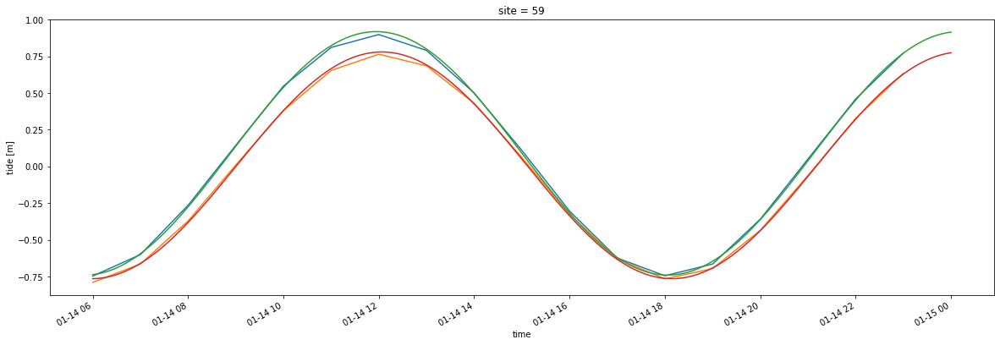

In [184]:
plt.figure(figsize=(20,6))

datasub.elev[it0:it1].plot(label='elev')
datasub.tide[it0:it1].plot(label='tide')

plt.plot(pd.date_range(datasub.time.values[it0],
                       datasub.time.values[it1],
                       periods=len(np.arange(0 , len(datasub.time[it0:it1])+0.1, 0.1))),
         cosine(np.arange(0 , len(datasub.time[it0:it1])+0.1, 0.1), *p1))

plt.plot(pd.date_range(datasub.time.values[it0],
                       datasub.time.values[it1],
                       periods=len(np.arange(0 , len(datasub.time[it0:it1])+0.1, 0.1))),
         cosine(np.arange(0 , len(datasub.time[it0:it1])+0.1, 0.1), *p2))

Here we take 2 sites, one for which we found high correlation between skew and storm surge and the other one for which a lower correlation was found and we calculate the lag for all tidal cycles

In [166]:
site_data = data.sel(site=1174)

tide = site_data.tide.drop_duplicates(dim='time').squeeze().dropna(dim='time')
elev = site_data.elev.drop_duplicates(dim='time').squeeze().dropna(dim='time')

time_index =  np.intersect1d(
            pd.to_datetime(tide.time).round('H'),
            #pd.to_datetime(data.skew_surge_magnitude.dropna(dim='time').time.values).round('H'),
            pd.to_datetime(elev.time).round('H'),
            return_indices=True
        )[0]

tide = tide.sel(time=time_index)
elev = elev.sel(time=time_index)

lags1174 = []
troughs = find_peaks(-tide.values)[0]
for it0,it1 in progressbar(zip(troughs[:-1],troughs[1:])):
    it1 = min(it1+6, len(tide.values)-1)
    
    if (tide.time[it1]-tide.time[it0]).values > np.timedelta64(1,'D') or (tide.time[it0]-tide.time[it1]).values > np.timedelta64(1,'D'):
        continue
    
    bounds=([elev[it0:it1].max().values-0.2, 10, 4,-0.5],
            [elev[it0:it1].max().values+0.2, 14, 8,0.5])
    
    pelev, covariance = optimize.curve_fit(cosine, range(len(elev[it0:it1])),
                                           elev[it0:it1].values, bounds=bounds)
    
    bounds=([tide[it0:it1].max().values-0.2, 10, 4,-0.5],
            [tide[it0:it1].max().values+0.2, 14, 8,0.5])
    ptide, covariance = optimize.curve_fit(cosine, range(len(tide.time[it0:it1])),
                                           tide[it0:it1].values, bounds=bounds)
    
    lags1174.append((pelev[2]-ptide[2])/ptide[1])

In [168]:
from progressbar import progressbar
site_data = data.sel(site=59)

tide = site_data.tide.drop_duplicates(dim='time').squeeze().dropna(dim='time')
elev = site_data.elev.drop_duplicates(dim='time').squeeze().dropna(dim='time')

time_index =  np.intersect1d(
            pd.to_datetime(tide.time).round('H'),
            #pd.to_datetime(data.skew_surge_magnitude.dropna(dim='time').time.values).round('H'),
            pd.to_datetime(elev.time).round('H'),
            return_indices=True
        )[0]

tide = tide.sel(time=time_index)
elev = elev.sel(time=time_index)

lags59 = []
troughs = find_peaks(-tide.values)[0]
for it0,it1 in progressbar(zip(troughs[:-1],troughs[1:])):
    it1 = min(it1+6, len(tide.values)-1)
    
    if (tide.time[it1]-tide.time[it0]).values > np.timedelta64(1,'D') or (tide.time[it0]-tide.time[it1]).values > np.timedelta64(1,'D'):
        continue
    
    bounds=([elev[it0:it1].max().values-0.2, 10, 4,-0.5],
            [elev[it0:it1].max().values+0.2, 14, 8,0.5])
    
    pelev, covariance = optimize.curve_fit(cosine, range(len(elev[it0:it1])),
                                           elev[it0:it1].values, bounds=bounds)
    
    bounds=([tide[it0:it1].max().values-0.2, 10, 4,-0.5],
            [tide[it0:it1].max().values+0.2, 14, 8,0.5])
    ptide, covariance = optimize.curve_fit(cosine, range(len(tide.time[it0:it1])),
                                           tide[it0:it1].values, bounds=bounds)
    
    lags59.append((pelev[2]-ptide[2])/ptide[1])

| |                              #                | 16824 Elapsed Time: 0:10:23


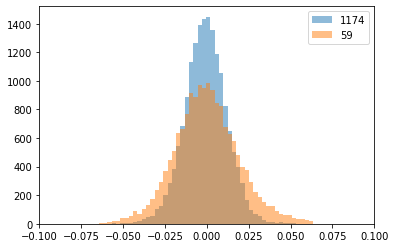

In [180]:
n, bins, patches = plt.hist(lags1174, bins=50, alpha=0.5, label='1174')
n, bins, patches = plt.hist(lags59, bins=bins, alpha=0.5, label='59')
plt.xlim(xmin=-0.1,xmax=0.1)
plt.legend()

Next would be to look only at the events when the skew surge is over a certain threshold

In [191]:
site_data.skew_surge_magnitude.drop_duplicates(dim='time').sel(time=time_index).dropna(dim='time').values[:10]

array([-0.017     ,  0.033     ,  0.07300001,  0.109     ,  0.087     ,
        0.142     ,  0.147     ,  0.16600001,  0.093     , -0.014     ],
      dtype=float32)

In [ ]:
from progressbar import progressbar
site_data = data.sel(site=59)

tide = site_data.tide.drop_duplicates(dim='time').squeeze().dropna(dim='time')
elev = site_data.elev.drop_duplicates(dim='time').squeeze().dropna(dim='time')
skew_surge = site_data.skew_surge_magnitude.drop_duplicates(dim='time')

time_index =  np.intersect1d(
            pd.to_datetime(tide.time).round('H'),
            pd.to_datetime(elev.time).round('H'),
            return_indices=True
        )[0]

tide = tide.sel(time=time_index)
elev = elev.sel(time=time_index)
skew_surge = skew_surge.sel(time=time_index)

lags = []
troughs = find_peaks(-tide.values)[0]

skew_surge_threshold = skew_surge.quantile(0.995).values

# Loop over tidal cycles
for it0,it1 in progressbar(zip(troughs[:-1],troughs[1:])):
    # Extend a little the data
    it1 = min(it1+6, len(tide.values)-1)
    
    # Discard all cases when only nan value of skew surge are available
    if np.isnan(skew_surge[it0:it1].values).all():
        continue
        
    # If the skew surge in the tidal cycle is lower than threshold jump to next cycle
    if np.nanmax(skew_surge[it0:it1].values) < skew_surge_threshold:
        continue
    
    # If the gap between two consecutive low tides is more than a day, then jump to next cycle
    if (tide.time[it1]-tide.time[it0]).values > np.timedelta64(1,'D') or (tide.time[it0]-tide.time[it1]).values > np.timedelta64(1,'D'):
        continue
    
    # Fit cosine curve to elevation data
    bounds=([elev[it0:it1].max().values-0.2, 10, 4,-0.5],
            [elev[it0:it1].max().values+0.2, 14, 8,0.5])
    
    pelev, covariance = optimize.curve_fit(cosine, range(len(elev[it0:it1])),
                                           elev[it0:it1].values, bounds=bounds)
    
    # Fit cosine curve to tide data
    bounds=([tide[it0:it1].max().values-0.2, 10, 4,-0.5],
            [tide[it0:it1].max().values+0.2, 14, 8,0.5])
    ptide, covariance = optimize.curve_fit(cosine, range(len(tide.time[it0:it1])),
                                           tide[it0:it1].values, bounds=bounds)
    
    # Store the lag divided by the tide duration
    lags.append((pelev[2]-ptide[2])/ptide[1])

In [219]:
javi_points

array([ 116,  200,  224,  328,  378,  393,  480,  488,  578,  613,  689,
        708,  744,  780,  803,  949,  999, 1025, 1064, 1124, 1146, 1174,
       1177, 1214, 1217, 1260, 1296, 1327, 1442])

In [221]:
from progressbar import progressbar

lags = {}

for site_id in javi_points:

    site_data = data.sel(site=site_id)

    tide = site_data.tide.drop_duplicates(dim='time').squeeze().dropna(dim='time')
    elev = site_data.elev.drop_duplicates(dim='time').squeeze().dropna(dim='time')
    skew_surge = site_data.skew_surge_magnitude.drop_duplicates(dim='time')

    # Define threshold for ske surge extremes
    skew_surge_threshold = skew_surge.chunk(dict(time=-1)).quantile(0.995).values
    
    time_index =  np.intersect1d(
                pd.to_datetime(tide.time).round('H'),
                pd.to_datetime(elev.time).round('H'),
                return_indices=True
            )[0]

    tide = tide.sel(time=time_index)
    elev = elev.sel(time=time_index)
    skew_surge = skew_surge.sel(time=time_index)

    lags[site_id] = {}
    lags[site_id]['lag'] = []
    lags[site_id]['pelev'] = []
    lags[site_id]['ptide'] = []
    lags[site_id]['it0'] = []
    lags[site_id]['it1'] = []

    # Find all the troughs in the tidal curves to identify tidal cycles
    troughs = find_peaks(-tide.values)[0]

    ## Define threshold for ske surge extremes
    #skew_surge_threshold = skew_surge.quantile(0.995).values

    # Loop over tidal cycles
    for it0,it1 in progressbar(zip(troughs[:-1],troughs[1:])):
        # Extend a little the data
        it1 = min(it1+6, len(tide.values)-1)

        # Discard all cases when only nan value of skew surge are available
        if np.isnan(skew_surge[it0:it1].values).all():
            continue

        # If the skew surge in the tidal cycle is lower than threshold jump to next cycle
        if np.nanmax(skew_surge[it0:it1].values) < skew_surge_threshold:
            continue

        # If the gap between two consecutive low tides is more than a day, then jump to next cycle
        if (tide.time[it1]-tide.time[it0]).values > np.timedelta64(1,'D') or (tide.time[it0]-tide.time[it1]).values > np.timedelta64(1,'D'):
            print("More than a day")
            continue

        # Fit cosine curve to elevation data
        bounds=([elev[it0:it1].max().values-0.2, 10, 4,-0.5],
                [elev[it0:it1].max().values+0.2, 14, 8,0.5])

        pelev, covariance = optimize.curve_fit(cosine, range(len(elev[it0:it1])),
                                               elev[it0:it1].values, bounds=bounds)

        # Fit cosine curve to tide data
        bounds=([tide[it0:it1].max().values-0.2, 10, 4,-0.5],
                [tide[it0:it1].max().values+0.2, 14, 8,0.5])
        ptide, covariance = optimize.curve_fit(cosine, range(len(tide.time[it0:it1])),
                                               tide[it0:it1].values, bounds=bounds)

        # Store the lag divided by the tide duration
        lags[site_id]['lag'].append((pelev[2]-ptide[2])/ptide[1])
        lags[site_id]['pelev'].append(pelev)
        lags[site_id]['ptide'].append(ptide)
        lags[site_id]['it0'].append(it0)
        lags[site_id]['it1'].append(it1)

| |        #                                      | 16824 Elapsed Time: 0:04:12
| |                             #                 | 16825 Elapsed Time: 0:04:16
| |                     #                         | 16825 Elapsed Time: 0:04:21
| |                      #                        | 16825 Elapsed Time: 0:04:11
| |                           #                   | 16825 Elapsed Time: 0:04:11
| |           #                                   | 16825 Elapsed Time: 0:04:22
| |                                #              | 16825 Elapsed Time: 0:04:29
| |                                  #            | 16825 Elapsed Time: 0:04:19
| |                         #                     | 16825 Elapsed Time: 0:03:57
| |         #                                     | 16825 Elapsed Time: 0:04:14
| |                                     #         | 16825 Elapsed Time: 0:05:25
| |                                  #            | 16825 Elapsed Time: 0:06:59
| |                               #     

In [222]:
javi_points

array([ 116,  200,  224,  328,  378,  393,  480,  488,  578,  613,  689,
        708,  744,  780,  803,  949,  999, 1025, 1064, 1124, 1146, 1174,
       1177, 1214, 1217, 1260, 1296, 1327, 1442])

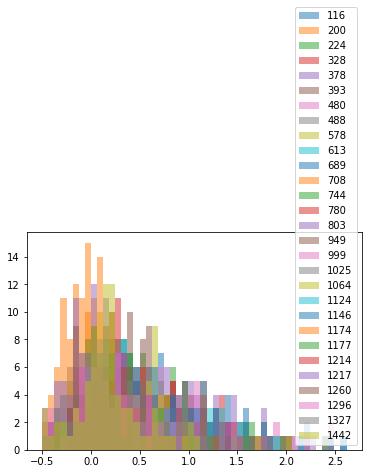

In [227]:
site_id = 116
n, bins, patches = plt.hist([pelev[2]*pelev[1]/ptide[1]-ptide[2] for pelev,ptide in zip(lags[site_id]['pelev'],lags[site_id]['ptide'])], bins=50, alpha=0.5, label=str(site_id))
#n, bins, patches = plt.hist(lags2, bins=bins, alpha=0.5, label='1174')

for site_id in javi_points[1:]:
    n, bins, patches = plt.hist([pelev[2]*pelev[1]/ptide[1]-ptide[2] for pelev,ptide in zip(lags[site_id]['pelev'],lags[site_id]['ptide'])], bins=bins, alpha=0.5, label=str(site_id))


#plt.xlim(xmin=-0.1,xmax=0.1)
plt.legend()

In [228]:
bins

array([-4.98954737e-01, -4.36618514e-01, -3.74282292e-01, -3.11946070e-01,
       -2.49609847e-01, -1.87273625e-01, -1.24937403e-01, -6.26011806e-02,
       -2.64958258e-04,  6.20712640e-02,  1.24407486e-01,  1.86743709e-01,
        2.49079931e-01,  3.11416153e-01,  3.73752376e-01,  4.36088598e-01,
        4.98424820e-01,  5.60761042e-01,  6.23097265e-01,  6.85433487e-01,
        7.47769709e-01,  8.10105932e-01,  8.72442154e-01,  9.34778376e-01,
        9.97114599e-01,  1.05945082e+00,  1.12178704e+00,  1.18412327e+00,
        1.24645949e+00,  1.30879571e+00,  1.37113193e+00,  1.43346815e+00,
        1.49580438e+00,  1.55814060e+00,  1.62047682e+00,  1.68281304e+00,
        1.74514927e+00,  1.80748549e+00,  1.86982171e+00,  1.93215793e+00,
        1.99449416e+00,  2.05683038e+00,  2.11916660e+00,  2.18150282e+00,
        2.24383904e+00,  2.30617527e+00,  2.36851149e+00,  2.43084771e+00,
        2.49318393e+00,  2.55552016e+00,  2.61785638e+00])

In [231]:
bins = np.linspace(-2.5,2.5,51)

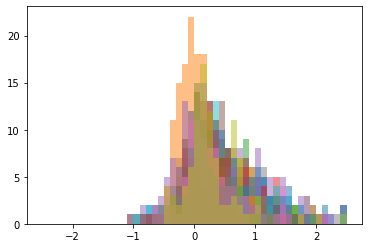

In [232]:
bins = np.linspace(-2.5,2.5,51)
for site_id in javi_points:
    n, bins, patches = plt.hist([pelev[2]*pelev[1]/ptide[1]-ptide[2] for pelev,ptide in zip(lags[site_id]['pelev'],lags[site_id]['ptide'])], bins=bins, alpha=0.5, label=str(site_id))

No handles with labels found to put in legend.


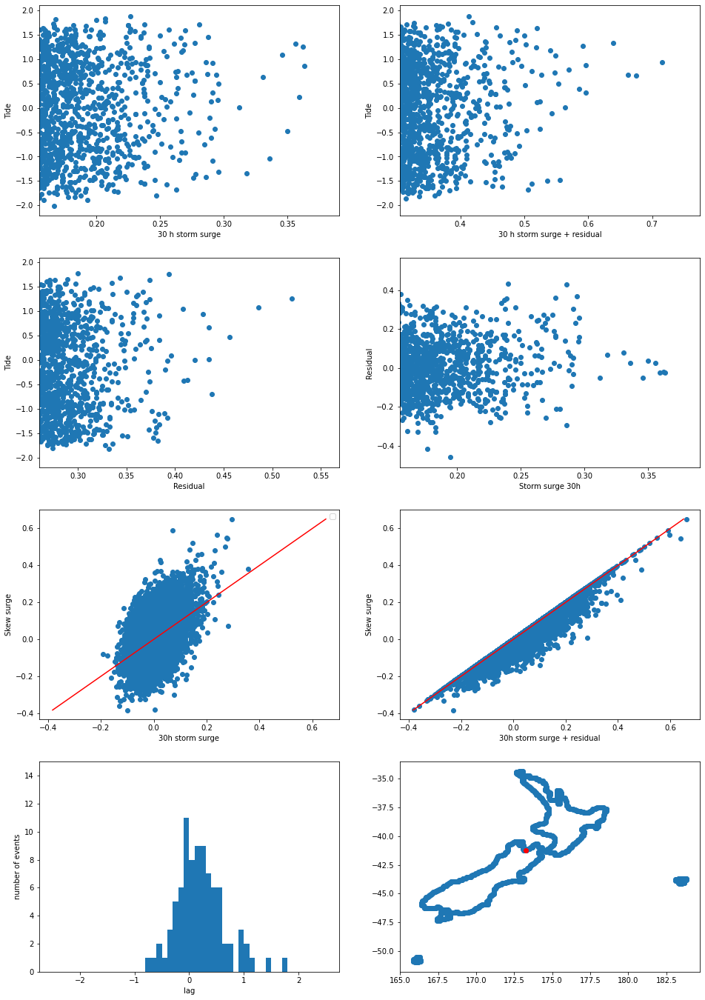

In [238]:
def do_plot(data_in, site_id, filename=None):
    data = data_in.sel(site=site_id)


    hourly_skew_surge_magitude = data.skew_surge_magnitude.squeeze().dropna(dim='time')

    hourly_skew_surge_lag = data.skew_surge_lag.squeeze().dropna(dim='time').astype(int)

    time_index =  np.intersect1d(
            pd.to_datetime(hourly_skew_surge_magitude.dropna(dim='time').time.values).round('H'),
            #pd.to_datetime(data.skew_surge_magnitude.dropna(dim='time').time.values).round('H'),
            pd.to_datetime(data.ss.dropna(dim='time').time.values).round('H'),
            return_indices=True
        )

    fig, axes = plt.subplots(ncols=2, nrows=4, figsize=(16,24))

    axes[0,0].scatter(data.ss.drop_duplicates(dim='time').squeeze(),
        data.tide.drop_duplicates(dim='time').squeeze())

    axes[0,0].set_xlabel('30 h storm surge')
    axes[0,0].set_ylabel('Tide')
    axes[0,0].set_xlim(xmin=data.ss.chunk(dict(time=-1)).drop_duplicates(dim='time').squeeze().quantile(0.995).values)

    axes[0,1].scatter((data.ss+data.res).drop_duplicates(dim='time').squeeze(),
        data.tide.drop_duplicates(dim='time').squeeze())

    axes[0,1].set_ylabel('Tide')
    axes[0,1].set_xlabel('30 h storm surge + residual')
    axes[0,1].set_xlim(xmin=(data.ss+data.res).chunk(dict(time=-1)).drop_duplicates(dim='time').squeeze().quantile(0.995).values)



    axes[1,0].scatter(data.res.drop_duplicates(dim='time').squeeze(),
        data.tide.drop_duplicates(dim='time').squeeze())

    axes[1,0].set_xlabel('Residual')
    axes[1,0].set_ylabel('Tide')
    axes[1,0].set_xlim(xmin=data.res.chunk(dict(time=-1)).drop_duplicates(dim='time').squeeze().quantile(0.995).values)

    axes[1,1].scatter((data.ss).drop_duplicates(dim='time').squeeze(),
        data.res.drop_duplicates(dim='time').squeeze())

    axes[1,1].set_xlabel('Storm surge 30h')
    axes[1,1].set_ylabel('Residual')
    axes[1,1].set_xlim(xmin=(data.ss).chunk(dict(time=-1)).drop_duplicates(dim='time').squeeze().quantile(0.995).values)


    vmax = max(data.ss.max(), hourly_skew_surge_magitude.max())
    vmin = min(data.ss.min(), hourly_skew_surge_magitude.min())

    

    axes[2,0].scatter(data.ss.drop_duplicates(dim='time').sel(time=time_index[0]).squeeze(),
                hourly_skew_surge_magitude.drop_duplicates(dim='time').sel(time=time_index[0]).squeeze())
    axes[2,0].plot([vmin, vmax], [vmin, vmax], color='red')
    axes[2,0].set_xlabel('30h storm surge')
    axes[2,0].set_ylabel('Skew surge')
    axes[2,0].legend()

    axes[2,1].scatter(data.ss.drop_duplicates(dim='time').sel(time=time_index[0]).squeeze()+data.res.drop_duplicates(dim='time').sel(time=time_index[0]).squeeze(),
                hourly_skew_surge_magitude.drop_duplicates(dim='time').sel(time=time_index[0]).squeeze())
    axes[2,1].plot([vmin, vmax], [vmin, vmax], color='red')
    axes[2,1].set_xlabel('30h storm surge + residual')
    axes[2,1].set_ylabel('Skew surge')

    #axes[3,0].plot([i for i in range(-6,7)], [np.sum(hourly_skew_surge_lag==i) for i in range(-6,7)])
    axes[3,0].set_xlabel('lag')
    axes[3,0].set_ylabel('number of events')
    
    bins = np.linspace(-2.5,2.5,51)
    #for site_id in javi_points:
    n, bins, patches = axes[3,0].hist([pelev[2]*pelev[1]/ptide[1]-ptide[2] for pelev,ptide in zip(lags[site_id]['pelev'],lags[site_id]['ptide'])], bins=bins, alpha=1, label=str(site_id))
    axes[3,0].set_ylim(ymin=0, ymax=15)
    
    axes[3,1].scatter(data_in.lon.values, data_in.lat.values)
    axes[3,1].scatter([data.lon.values],[data.lat.values], color='red')
    
    if filename:
        plt.savefig(filename)

site_id=708
do_plot(data_in=data,
        site_id=site_id,#59,
        filename='/tmp/ss/ss_%i.png'%(site_id))

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
/tmp/ipykernel_1374039/3003448071.py:16: RuntimeWarning: Mor

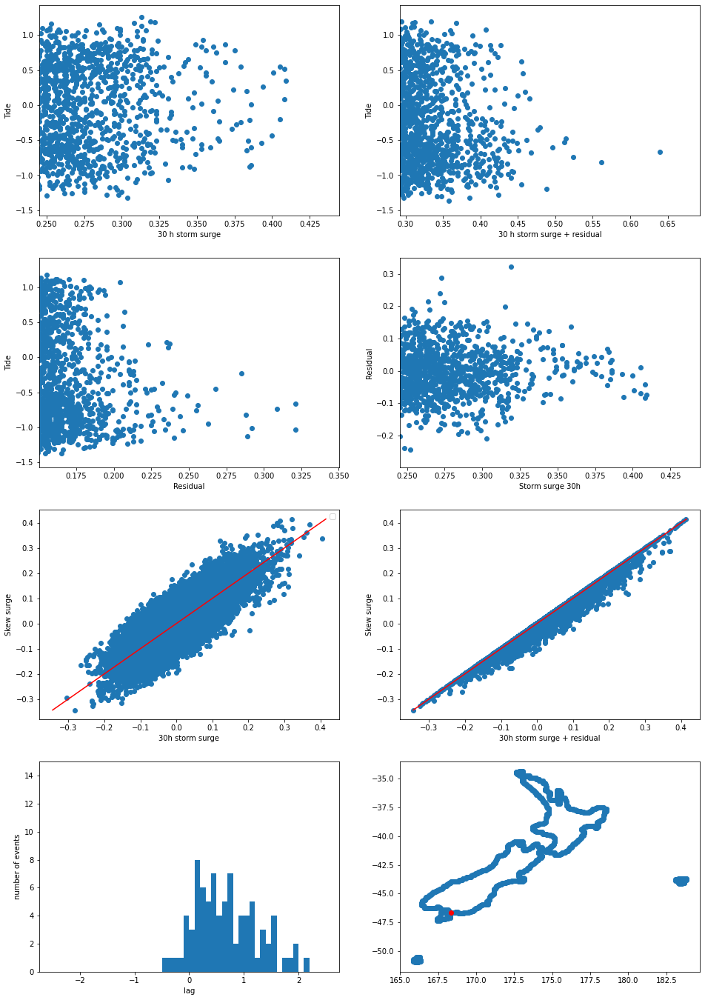

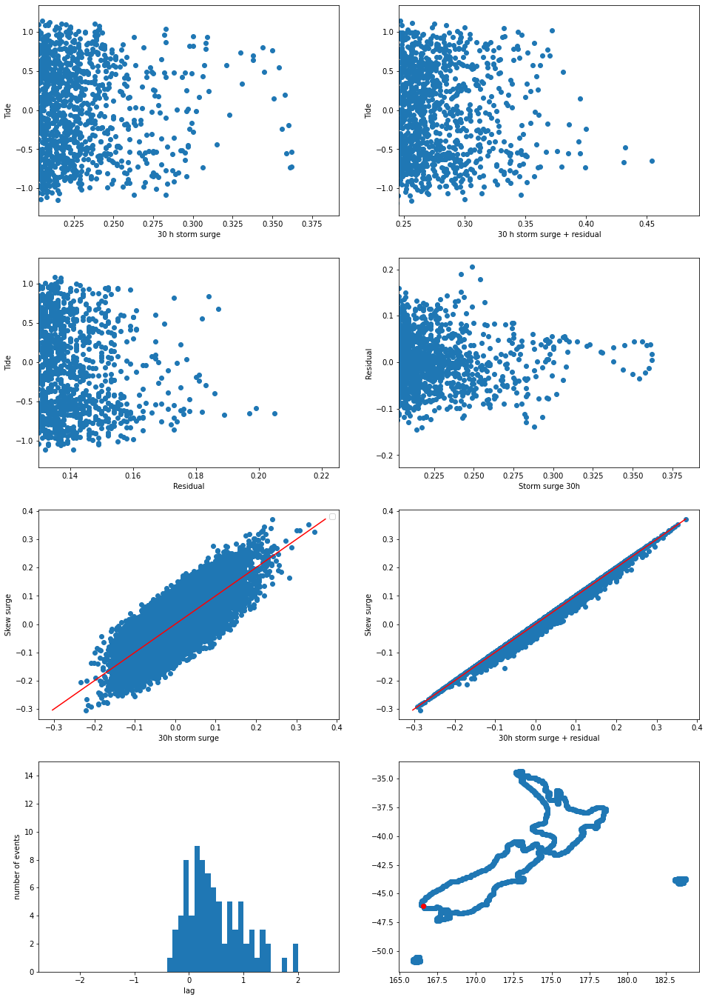

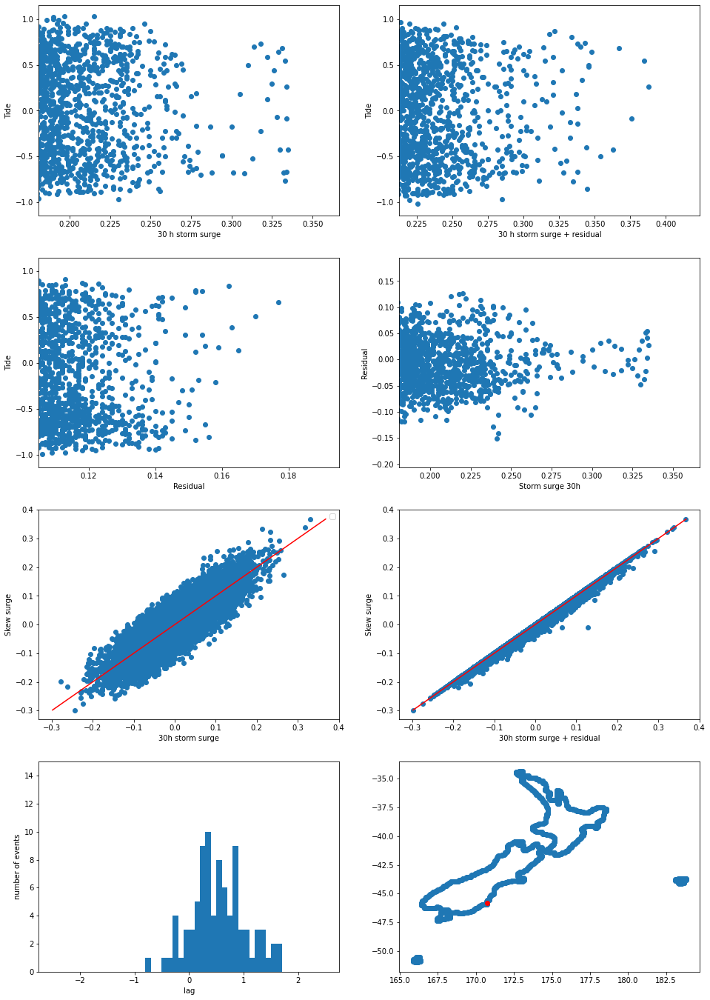

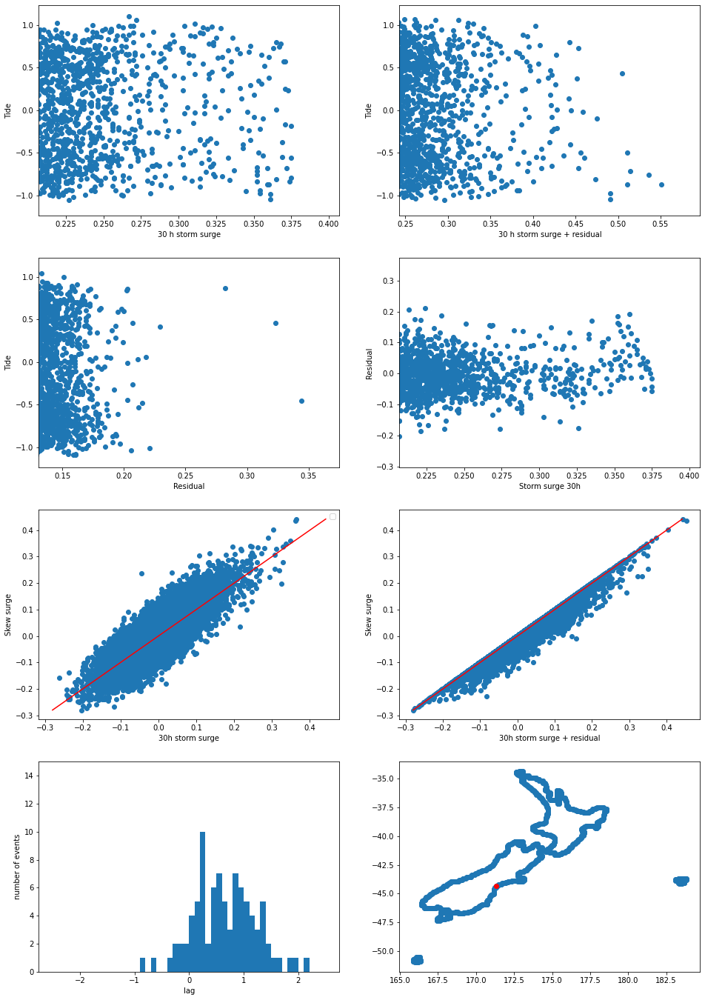

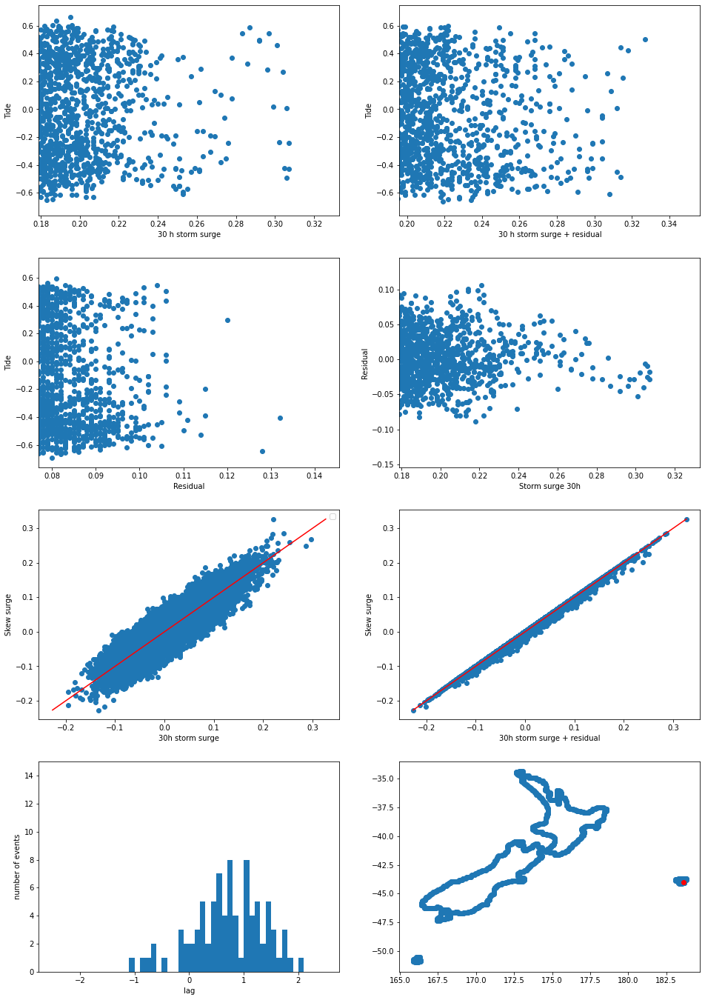

...

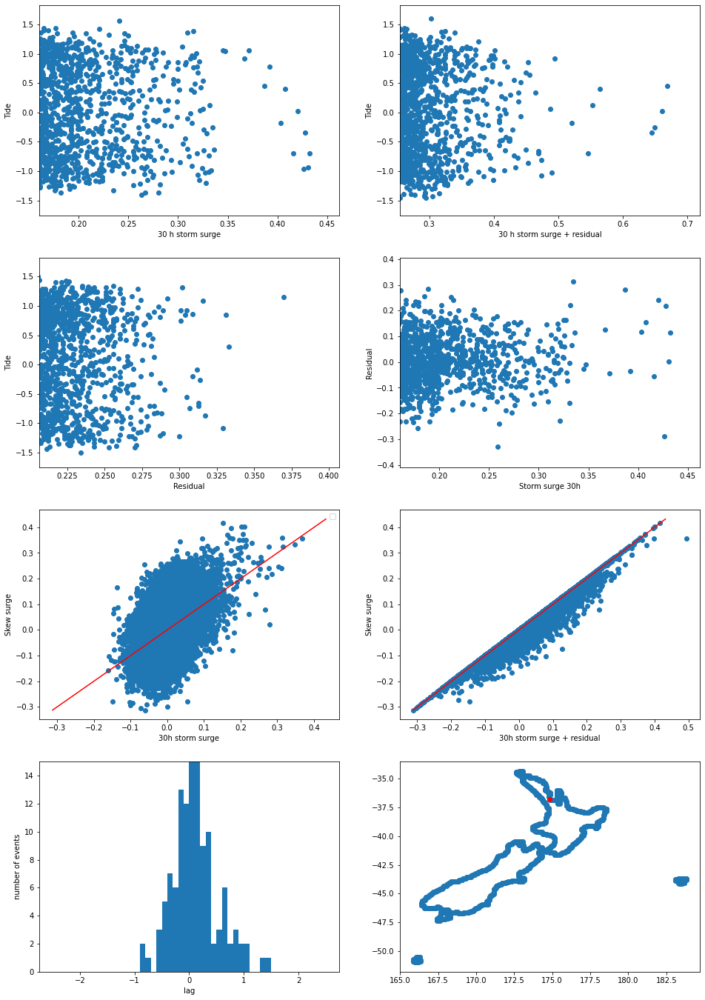

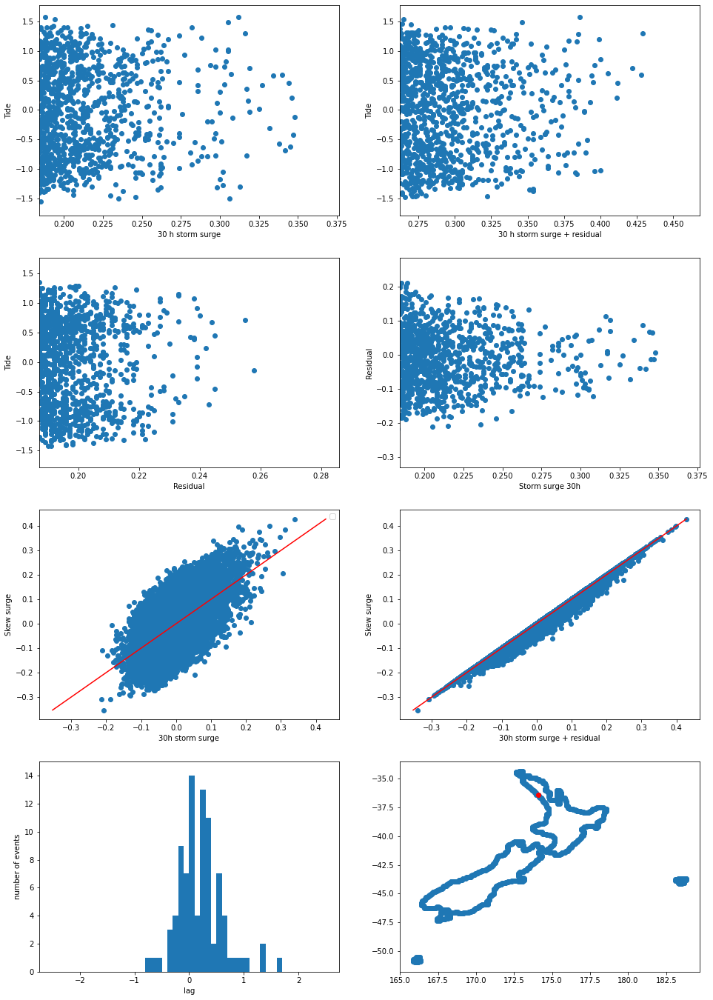

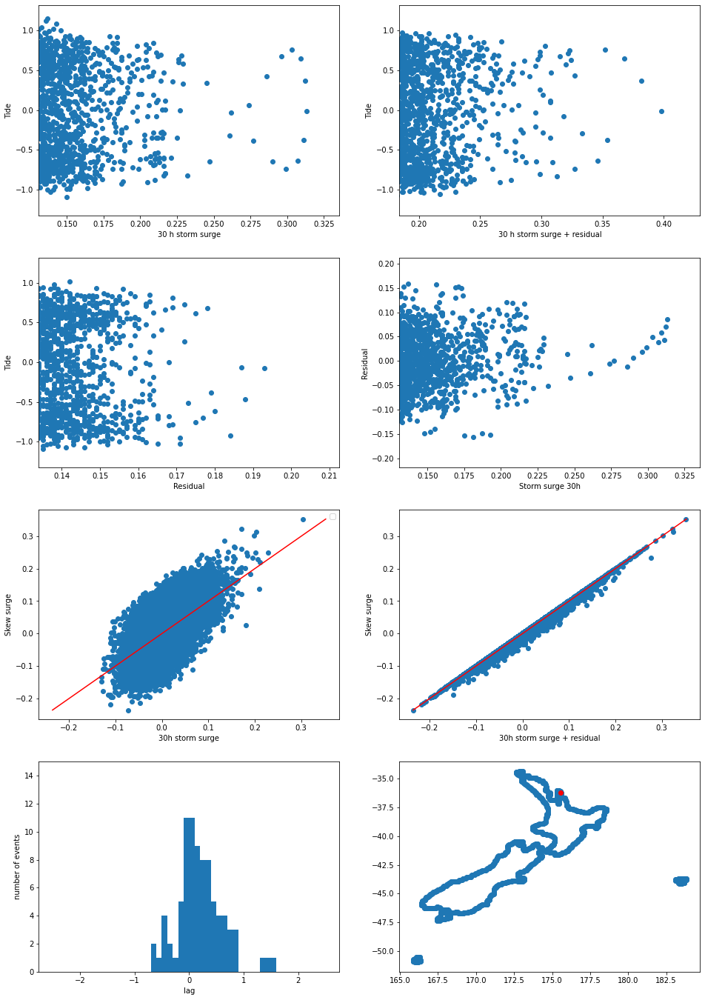

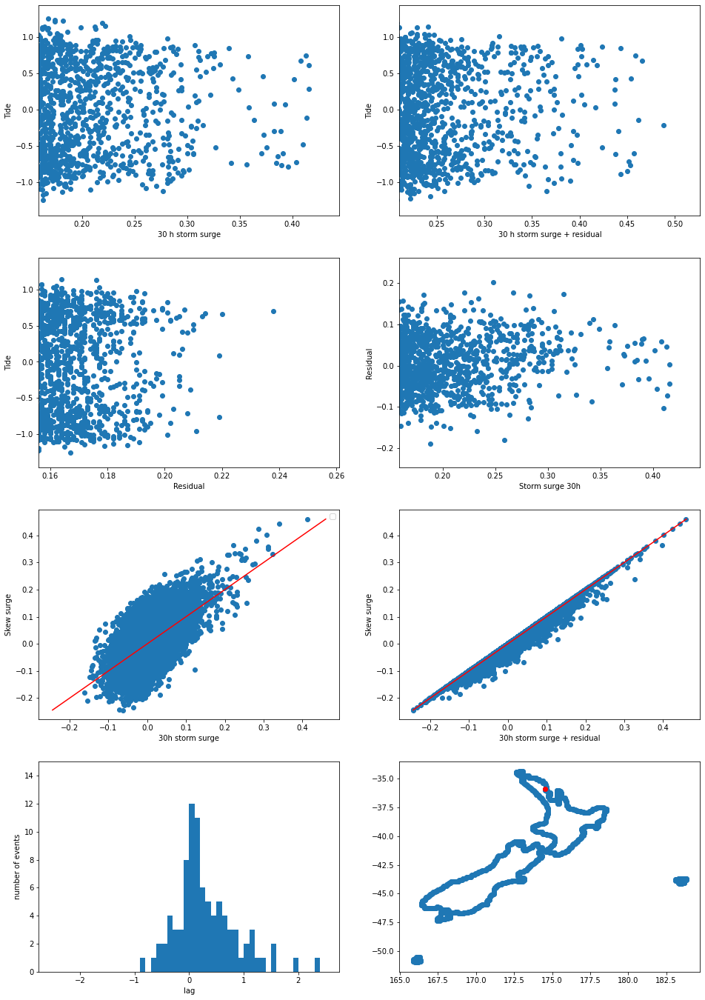

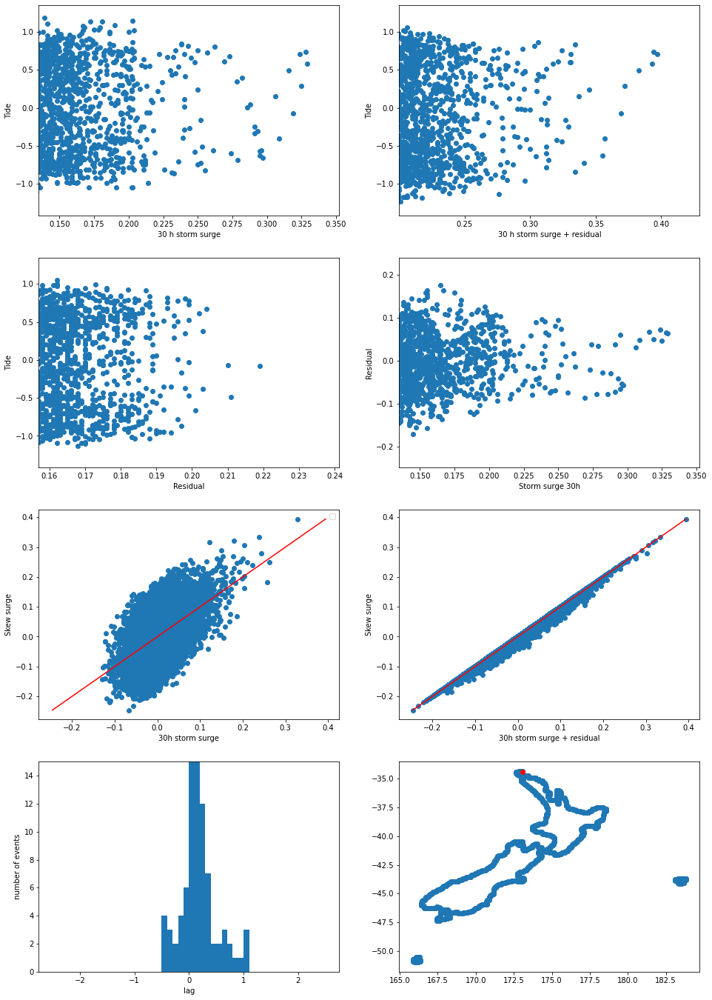

In [239]:
for site_id in javi_points:
    do_plot(data_in=data,
        site_id=site_id,#59,
        filename='/tmp/ss/ss_%i.png'%(site_id))

Now we will see if we can improve on the cosine and use a simple second degree polynomial to identifying better the maxima in tide and total water level. If either quantity follow a cosine shape, then close to the maxima a second degree polynomial should be a reasonnable approximation.
We don't even look at fitting the polynomial. We just work with the 3 points the closest to the maxima and take the second order polynomial that exactly passes through those.

First we look at an example for which the old cosine fit did not use to work well

In [250]:
# Old cosine function
def cosine(t, amplitude, period, phase,offset):
    return amplitude*np.cos(2*np.pi*((t+phase)/period))+offset

# Function that returns the coefficients of the polynomial knowing the
# coordinates of the 3 consecutive points
def polyfit(x,y):
    [x1,x2,x3] = x
    [y1,y2,y3] = y
    a = ((y1-y2)-(y2-y3)*(x1-x2)/(x2-x3))/((x1*x1-x2*x2)-(x2*x2-x3*x3)*(x1-x2)/(x2-x3))
    b = ((y1-y2)-a*(x1*x1-x2*x2))/(x1-x2)
    c = y1-a*x1*x1-b*x1
    
    return [a,b,c]

# Function that evaluate the polynomial
def poly(t,coeffs):
    return (coeffs[0]*t+coeffs[1])*t+coeffs[2]

Fit the "old" cosine function

In [240]:
# Bounds are to find fit parameters in a narrower range    
bounds=([data_in.elev[3:20].max().values-0.2, 10, 4,-0.5],[data_in.elev[3:20].max().values+0.2, 14, 8,0.5])
pelev, covariance = optimize.curve_fit(cosine, range(len(data_in.elev[3:20])),
                                       data_in.elev[3:20].values, bounds=bounds)

bounds=([data_in.tide[3:20].max().values-0.4, 9, 2,-0.5],[data_in.tide[3:20].max().values+0.4, 15, 10,0.5])
ptide, covariance = optimize.curve_fit(cosine, range(len(data_in.time[3:20])),
                                       data_in.tide[3:20].values, bounds=bounds)
pelev[2], ptide[2], pelev[2]/pelev[1]-ptide[2]/ptide[1]

(6.700351826047669, 6.436884419767498, 0.0172580724452851)

Fit the polynomial and plot 3 points and polynomial

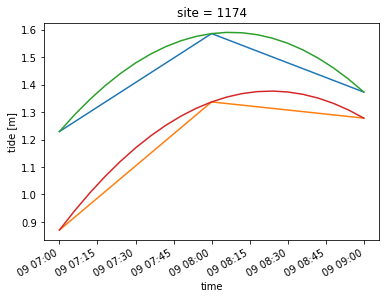

In [257]:
data_in.elev[7:10].plot(label='elev2')
data_in.tide[7:10].plot(label='tide2')

c_elev = polyfit(x=[7,8,9],y=list(data_in.elev[7:10].values))
c_tide = polyfit(x=[7,8,9],y=list(data_in.tide[7:10].values))

plt.plot(pd.date_range(data_in.time.values[7], data_in.time.values[9], periods=len(np.arange(7 , 9+0.1, 0.1))),
         [poly(t,c_elev) for t in np.arange(7 , 9+0.1, 0.1)])
plt.plot(pd.date_range(data_in.time.values[7], data_in.time.values[9], periods=len(np.arange(7 , 9+0.1, 0.1))),
         [poly(t,c_tide) for t in np.arange(7 , 9+0.1, 0.1)])




Now put all of the same graph. The polynomial is obviously by design a lot closer to the data and looks realistic

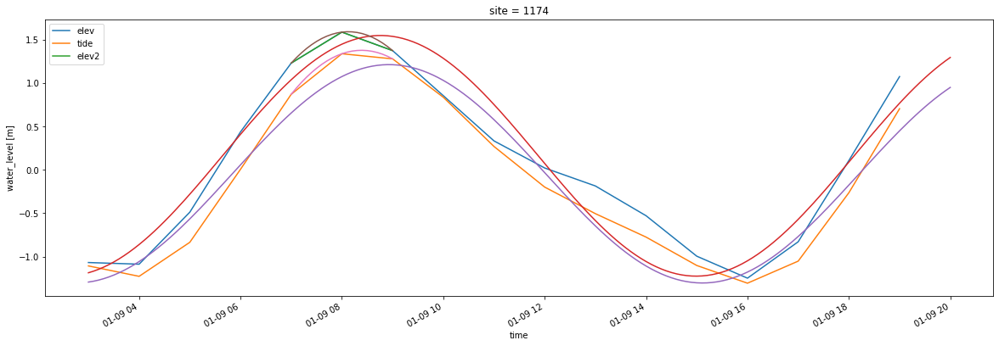

In [258]:
plt.figure(figsize=(20,6))
data_in.elev[3:20].plot(label='elev')
data_in.tide[3:20].plot(label='tide')

plt.plot(pd.date_range(data_in.time.values[3], data_in.time.values[20], periods=len(np.arange(0 , len(data_in.time[3:20])+0.1, 0.1))),
         cosine(np.arange(0 , len(data_in.time[3:20])+0.1, 0.1), *pelev))

plt.plot(pd.date_range(data_in.time.values[3],
                       data_in.time.values[20],
                       periods=len(np.arange(0 , len(data_in.time[3:20])+0.1, 0.1))),
         cosine(np.arange(0 , len(data_in.time[3:20])+0.1, 0.1), *ptide))

plt.plot(pd.date_range(data_in.time.values[7], data_in.time.values[9], periods=len(np.arange(7 , 9+0.1, 0.1))),
         [poly(t,c_elev) for t in np.arange(7 , 9+0.1, 0.1)])
plt.plot(pd.date_range(data_in.time.values[7], data_in.time.values[9], periods=len(np.arange(7 , 9+0.1, 0.1))),
         [poly(t,c_tide) for t in np.arange(7 , 9+0.1, 0.1)])


plt.legend()



Just to check we do it in a case that works well with the cosine. It seems to work fine too

In [259]:
def cosine(t, amplitude, period, phase,offset):
    return amplitude*np.cos(2*np.pi*((t+phase)/period))+offset
    
# Bounds are to find fit parameters in a narrower range    
bounds=([datasub.elev[8:24].max().values-0.2, 10, 4,-0.5],[datasub.elev[8:24].max().values+0.2, 14, 8,0.5])
pelev, covariance = optimize.curve_fit(cosine, range(len(datasub.elev[8:24])),
                                       datasub.elev[8:24].values, bounds=bounds)

bounds=([datasub.tide[8:24].max().values-0.2, 10, 4,-0.5],[datasub.tide[8:24].max().values+0.2, 14, 8,0.5])
ptide, covariance = optimize.curve_fit(cosine, range(len(datasub.time[8:24])),
                                       datasub.tide[8:24].values, bounds=bounds)
pelev[2], ptide[2], pelev[2]/pelev[1]-ptide[2]/ptide[1]

(5.8409071629259115, 5.84763764016235, -0.002321535021730936)

14.43354423813783 14.44915258346773


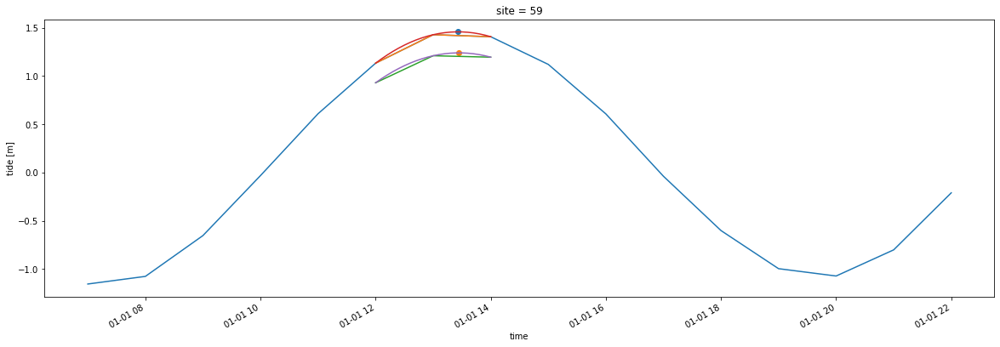

In [288]:
ite=14
itt=14
plt.figure(figsize=(20,6))
datasub.elev[8:24].plot(label='elev')

datasub.elev[ite-1:ite+2].plot(label='elev2')
datasub.tide[itt-1:itt+2].plot(label='tide2')

c_elev = polyfit(x=[ite-1,ite,ite+1],y=list(datasub.elev[ite-1:ite+2].values))
c_tide = polyfit(x=[itt-1,itt,itt+1],y=list(datasub.tide[itt-1:itt+2].values))

plt.plot(pd.date_range(datasub.time.values[ite-1], datasub.time.values[ite+1], periods=len(np.arange(ite-1 , ite+1+0.1, 0.1))),
         [poly(t,c_elev) for t in np.arange(ite-1 , ite+1+0.1, 0.1)])
plt.plot(pd.date_range(datasub.time.values[itt-1], datasub.time.values[itt+1], periods=len(np.arange(itt-1 , itt+1+0.1, 0.1))),
         [poly(t,c_tide) for t in np.arange(itt-1 , itt+1+0.1, 0.1)])

# max is when derivative is 0
it_max_elev = - c_elev[1]/(2.*c_elev[0])
it_max_tide =  - c_tide[1]/(2.*c_tide[0])

t_max_elev = datasub.time.values[ite-1] + ((it_max_elev-(ite-1))/2.)*(datasub.time.values[ite+1]-datasub.time.values[ite-1])
t_max_tide = datasub.time.values[itt-1] + ((it_max_tide-(itt-1))/2.)*(datasub.time.values[itt+1]-datasub.time.values[itt-1])


plt.scatter([tt_max_elev], [poly(it_max_elev,c_elev)])
plt.scatter([tt_max_tide], [poly(it_max_tide,c_tide)])

poly_lag = t_max_tide - t_max_elev


#plt.ylim(ymin=1)

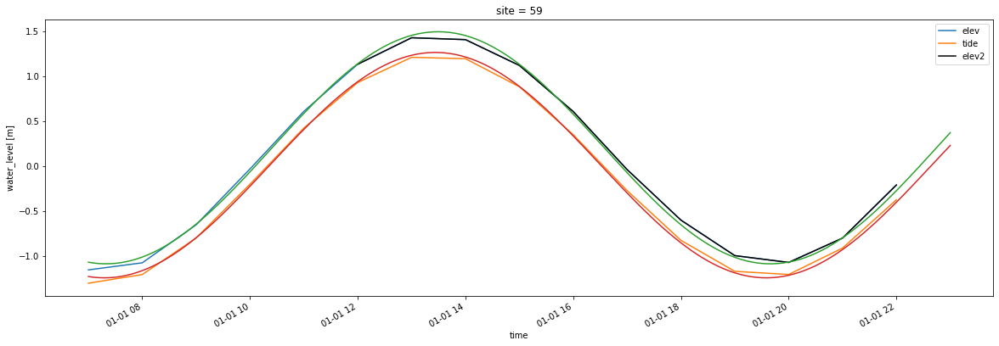

In [266]:
plt.figure(figsize=(20,6))
datasub.elev[8:24].plot(label='elev')
datasub.tide[8:24].plot(label='tide')
datasub.elev[13:24].plot(label='elev2', color='black')

plt.plot(pd.date_range(datasub.time.values[8], datasub.time.values[24], periods=len(np.arange(0 , len(datasub.time[8:24])+0.1, 0.1))),
         cosine(np.arange(0 , len(datasub.time[8:24])+0.1, 0.1), *pelev))

plt.plot(pd.date_range(datasub.time.values[8],
                       datasub.time.values[24],
                       periods=len(np.arange(0 , len(datasub.time[8:24])+0.1, 0.1))),
         cosine(np.arange(0 , len(datasub.time[8:24])+0.1, 0.1), *ptide))

plt.legend()

Now we adapt it to process full time series.
Note what we are now missing is to calculate the tidal period to normalise the lag

In [317]:
from progressbar import progressbar

polylags = {}

for site_id in javi_points:

    site_data = data.sel(site=site_id)

    tide = site_data.tide.drop_duplicates(dim='time').squeeze().dropna(dim='time')
    elev = site_data.elev.drop_duplicates(dim='time').squeeze().dropna(dim='time')
    skew_surge = site_data.skew_surge_magnitude.drop_duplicates(dim='time')

    # Define threshold for ske surge extremes
    skew_surge_threshold = skew_surge.chunk(dict(time=-1)).quantile(0.995).values
    
    time_index =  np.intersect1d(
                pd.to_datetime(tide.time).round('H'),
                pd.to_datetime(elev.time).round('H'),
                return_indices=True
            )[0]

    tide = tide.sel(time=time_index)
    elev = elev.sel(time=time_index)
    skew_surge = skew_surge.sel(time=time_index)

    polylags[site_id] = {}
    polylags[site_id]['lag'] = []
    polylags[site_id]['c_elev'] = []
    polylags[site_id]['c_tide'] = []
    #polylags[site_id]['pelev'] = []
    #polylags[site_id]['ptide'] = []
    polylags[site_id]['it0'] = []
    polylags[site_id]['it1'] = []
    polylags[site_id]['ite'] = []
    polylags[site_id]['itt'] = []
    
    # Find all the peaks in the tidal curves to identify tidal cycles
    troughs = find_peaks(-tide.values)[0]

    ## Define threshold for ske surge extremes
    #skew_surge_threshold = skew_surge.quantile(0.995).values

    # Loop over tidal cycles
    for it0,it1 in progressbar(zip(troughs[:-1],troughs[1:])):
        

        # Discard all cases when only nan value of skew surge are available
        if np.isnan(skew_surge[it0:it1].values).all():
            continue

        # If the skew surge in the tidal cycle is lower than threshold jump to next cycle
        if np.nanmax(skew_surge[it0:it1].values) < skew_surge_threshold:
            continue

        # If the gap between two consecutive low tides is more than a day, then jump to next cycle
        if (tide.time[it1]-tide.time[it0]).values > np.timedelta64(1,'D') or (tide.time[it0]-tide.time[it1]).values > np.timedelta64(1,'D'):
            print("More than a day")
            continue
            
        # Find peak in tide
        peak_tide = find_peaks(tide.values[it0+2: it1-2])[0]
        if len(peak_tide) != 1:
            print("Found", len(peak_tide),"tide peaks in tidal cycle")
            continue
        
        # Find peak in elev
        peak_elev = find_peaks(elev.values[it0+2: it1-2])[0]
        if len(peak_elev) != 1:
            print("Found", len(peak_elev),"elev peaks in tidal cycle")
            continue
        
        
        ite = it0-2+peak_elev[0]
        itt = it0-2+peak_tide[0]
        
        c_elev = polyfit(x=[ite-1,ite,ite+1],y=list(elev[ite-1:ite+2].values))
        c_tide = polyfit(x=[itt-1,itt,itt+1],y=list(tide[itt-1:itt+2].values))

        #plt.plot(pd.date_range(datasub.time.values[ite-1], datasub.time.values[ite+1], periods=len(np.arange(ite-1 , ite+1+0.1, 0.1))),
        # [poly(t,c_elev) for t in np.arange(ite-1 , ite+1+0.1, 0.1)])
        #plt.plot(pd.date_range(datasub.time.values[itt-1], datasub.time.values[itt+1], periods=len(np.arange(itt-1 , itt+1+0.1, 0.1))),
        # [poly(t,c_tide) for t in np.arange(itt-1 , itt+1+0.1, 0.1)])

        # max is when derivative is 0
        it_max_elev = - c_elev[1]/(2.*c_elev[0])
        it_max_tide =  - c_tide[1]/(2.*c_tide[0])

        t_max_elev = elev.time.values[ite-1]\
                   + ((it_max_elev-(ite-1))/2.)*(elev.time.values[ite+1]-elev.time.values[ite-1])
        t_max_tide = tide.time.values[itt-1]\
                   + ((it_max_tide-(itt-1))/2.)*(tide.time.values[itt+1]-tide.time.values[itt-1])


        #plt.scatter([tt_max_elev], [poly(it_max_elev,c_elev)])
        #plt.scatter([tt_max_tide], [poly(it_max_tide,c_tide)])

        poly_lag = t_max_elev-t_max_tide

        # Store the lag divided by the tide duration
        polylags[site_id]['lag'].append(t_max_elev-t_max_tide)
        polylags[site_id]['c_elev'].append(c_elev)
        polylags[site_id]['c_tide'].append(c_tide)
        polylags[site_id]['ite'].append(ite)
        polylags[site_id]['itt'].append(itt)
        #polylags[site_id]['pelev'].append(pelev)
        #polylags[site_id]['ptide'].append(ptide)
        polylags[site_id]['it0'].append(it0)
        polylags[site_id]['it1'].append(it1)

| |                                        #      | 16824 Elapsed Time: 0:04:27
| |                       #                       | 16825 Elapsed Time: 0:04:34
| |                                            #  | 16825 Elapsed Time: 0:04:37
| |                      #                        | 16825 Elapsed Time: 0:04:25
| |                                   #           | 16825 Elapsed Time: 0:04:36
| |                                             # | 16825 Elapsed Time: 0:04:28
- |                            #                   | 4675 Elapsed Time: 0:01:13

Found 2 elev peaks in tidal cycle


| |              #                                | 16825 Elapsed Time: 0:04:34
/ |                       #                        | 4677 Elapsed Time: 0:01:14

Found 2 elev peaks in tidal cycle


\ |                                    #           | 8359 Elapsed Time: 0:02:18/tmp/ipykernel_1374039/2855994371.py:85: RuntimeWarning: divide by zero encountered in double_scalars
  it_max_elev = - c_elev[1]/(2.*c_elev[0])
| |            #                                  | 16825 Elapsed Time: 0:04:40
| |         #                                     | 16825 Elapsed Time: 0:04:33
| |                   #                           | 16825 Elapsed Time: 0:04:21
| |                           #                   | 16825 Elapsed Time: 0:04:25
| |             #                                 | 16825 Elapsed Time: 0:04:31
| |                                              #| 16825 Elapsed Time: 0:04:27
| |                   #                           | 16825 Elapsed Time: 0:04:11
| |           #                                   | 16825 Elapsed Time: 0:04:24
| |                  #                             | 2467 Elapsed Time: 0:00:30

Found 2 elev peaks in tidal cycle


| |                        #                      | 16825 Elapsed Time: 0:03:52
| |                        #                      | 16825 Elapsed Time: 0:04:11
| |        #                                      | 16825 Elapsed Time: 0:04:14
| |             #                                 | 16825 Elapsed Time: 0:04:12
| |                          #                    | 16825 Elapsed Time: 0:04:07
| |         #                                     | 16825 Elapsed Time: 0:04:24
| |         #                                     | 10229 Elapsed Time: 0:02:40

Found 2 elev peaks in tidal cycle


| |                      #                        | 16825 Elapsed Time: 0:04:30
| |           #                                   | 16825 Elapsed Time: 0:04:31
| |            #                                  | 16825 Elapsed Time: 0:04:21
| |                               #               | 16825 Elapsed Time: 0:04:16
| |                                  #            | 16825 Elapsed Time: 0:04:17
| |  #                                            | 16825 Elapsed Time: 0:04:32
- |              #                                 | 2095 Elapsed Time: 0:00:36

Found 2 elev peaks in tidal cycle


| |                                        #      | 16825 Elapsed Time: 0:04:36
| |   #                                           | 16825 Elapsed Time: 0:04:32


We plot the results. That's one step forward but needs sanity checks

No handles with labels found to put in legend.


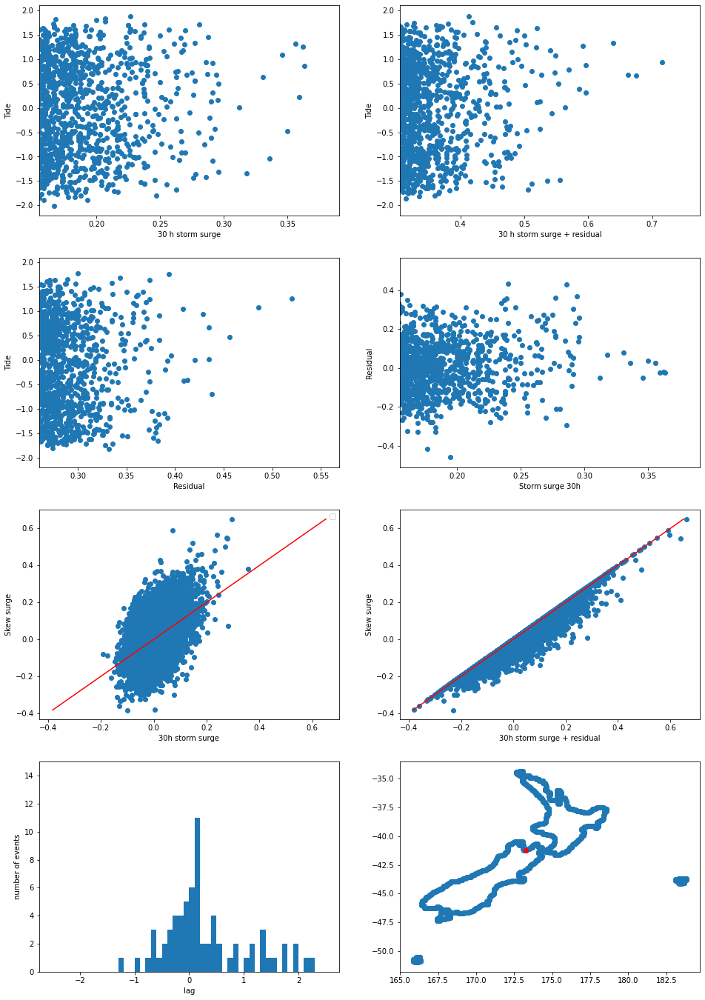

In [320]:
def do_plot(data_in, site_id, filename=None):
    data = data_in.sel(site=site_id)


    hourly_skew_surge_magitude = data.skew_surge_magnitude.squeeze().dropna(dim='time')

    hourly_skew_surge_lag = data.skew_surge_lag.squeeze().dropna(dim='time').astype(int)

    time_index =  np.intersect1d(
            pd.to_datetime(hourly_skew_surge_magitude.dropna(dim='time').time.values).round('H'),
            #pd.to_datetime(data.skew_surge_magnitude.dropna(dim='time').time.values).round('H'),
            pd.to_datetime(data.ss.dropna(dim='time').time.values).round('H'),
            return_indices=True
        )

    fig, axes = plt.subplots(ncols=2, nrows=4, figsize=(16,24))

    axes[0,0].scatter(data.ss.drop_duplicates(dim='time').squeeze(),
        data.tide.drop_duplicates(dim='time').squeeze())

    axes[0,0].set_xlabel('30 h storm surge')
    axes[0,0].set_ylabel('Tide')
    axes[0,0].set_xlim(xmin=data.ss.chunk(dict(time=-1)).drop_duplicates(dim='time').squeeze().quantile(0.995).values)

    axes[0,1].scatter((data.ss+data.res).drop_duplicates(dim='time').squeeze(),
        data.tide.drop_duplicates(dim='time').squeeze())

    axes[0,1].set_ylabel('Tide')
    axes[0,1].set_xlabel('30 h storm surge + residual')
    axes[0,1].set_xlim(xmin=(data.ss+data.res).chunk(dict(time=-1)).drop_duplicates(dim='time').squeeze().quantile(0.995).values)



    axes[1,0].scatter(data.res.drop_duplicates(dim='time').squeeze(),
        data.tide.drop_duplicates(dim='time').squeeze())

    axes[1,0].set_xlabel('Residual')
    axes[1,0].set_ylabel('Tide')
    axes[1,0].set_xlim(xmin=data.res.chunk(dict(time=-1)).drop_duplicates(dim='time').squeeze().quantile(0.995).values)

    axes[1,1].scatter((data.ss).drop_duplicates(dim='time').squeeze(),
        data.res.drop_duplicates(dim='time').squeeze())

    axes[1,1].set_xlabel('Storm surge 30h')
    axes[1,1].set_ylabel('Residual')
    axes[1,1].set_xlim(xmin=(data.ss).chunk(dict(time=-1)).drop_duplicates(dim='time').squeeze().quantile(0.995).values)


    vmax = max(data.ss.max(), hourly_skew_surge_magitude.max())
    vmin = min(data.ss.min(), hourly_skew_surge_magitude.min())

    

    axes[2,0].scatter(data.ss.drop_duplicates(dim='time').sel(time=time_index[0]).squeeze(),
                hourly_skew_surge_magitude.drop_duplicates(dim='time').sel(time=time_index[0]).squeeze())
    axes[2,0].plot([vmin, vmax], [vmin, vmax], color='red')
    axes[2,0].set_xlabel('30h storm surge')
    axes[2,0].set_ylabel('Skew surge')
    axes[2,0].legend()

    axes[2,1].scatter(data.ss.drop_duplicates(dim='time').sel(time=time_index[0]).squeeze()+data.res.drop_duplicates(dim='time').sel(time=time_index[0]).squeeze(),
                hourly_skew_surge_magitude.drop_duplicates(dim='time').sel(time=time_index[0]).squeeze())
    axes[2,1].plot([vmin, vmax], [vmin, vmax], color='red')
    axes[2,1].set_xlabel('30h storm surge + residual')
    axes[2,1].set_ylabel('Skew surge')

    #axes[3,0].plot([i for i in range(-6,7)], [np.sum(hourly_skew_surge_lag==i) for i in range(-6,7)])
    axes[3,0].set_xlabel('lag')
    axes[3,0].set_ylabel('number of events')
    
    bins = np.linspace(-2.5,2.5,51)
    #for site_id in javi_points:
    #n, bins, patches = axes[3,0].hist([pelev[2]*pelev[1]/ptide[1]-ptide[2] for pelev,ptide in zip(lags[site_id]['pelev'],lags[site_id]['ptide'])], bins=bins, alpha=1, label=str(site_id))
    n, bins, patches = axes[3,0].hist(polylags[site_id]['lag']/np.timedelta64(12,'h'), bins=bins, alpha=1, label=str(site_id))
    
    axes[3,0].set_ylim(ymin=0, ymax=15)
    
    axes[3,1].scatter(data_in.lon.values, data_in.lat.values)
    axes[3,1].scatter([data.lon.values],[data.lat.values], color='red')
    
    if filename:
        plt.savefig(filename)

site_id=708
do_plot(data_in=data,
        site_id=site_id,#59,
        filename='/tmp/ss/poly_ss_%i.png'%(site_id))

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
/tmp/ipykernel_1374039/1467608577.py:16: RuntimeWarning: Mor

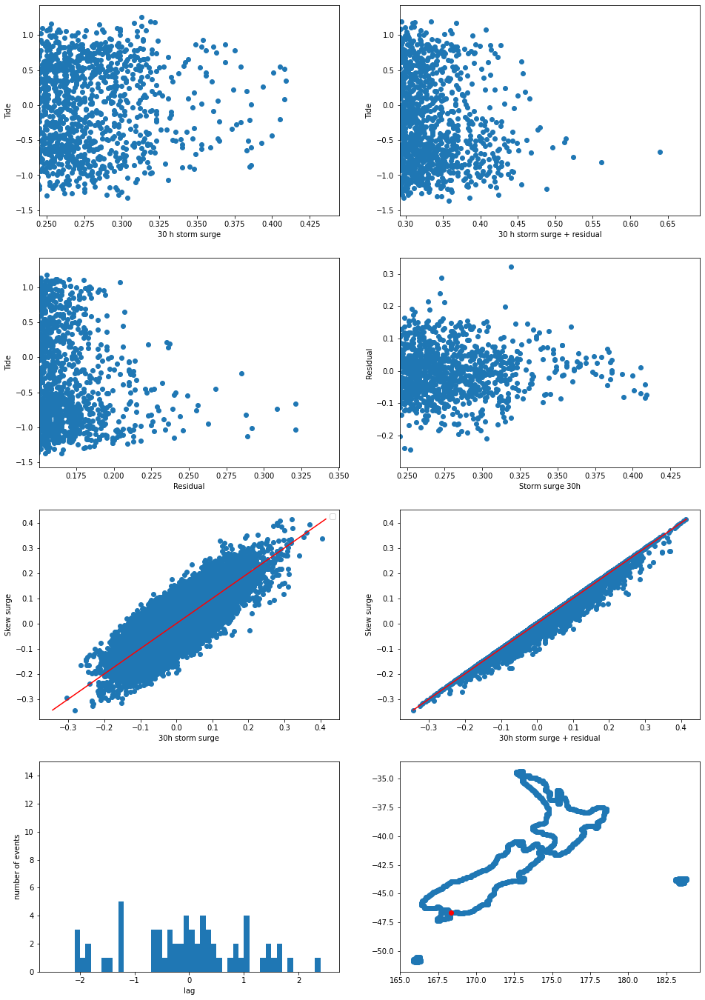

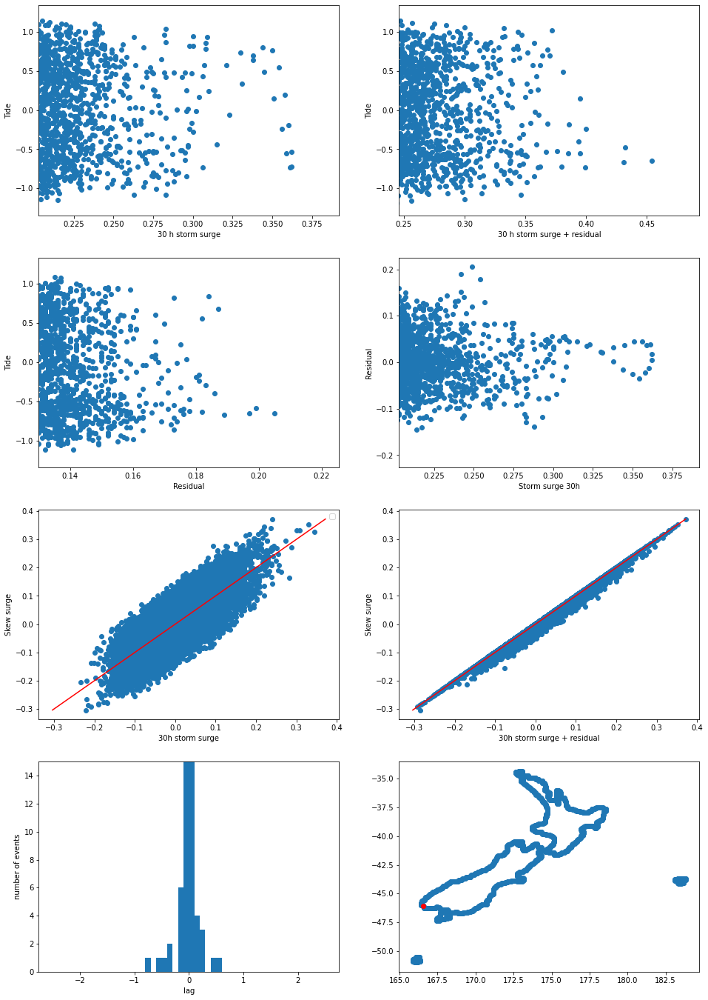

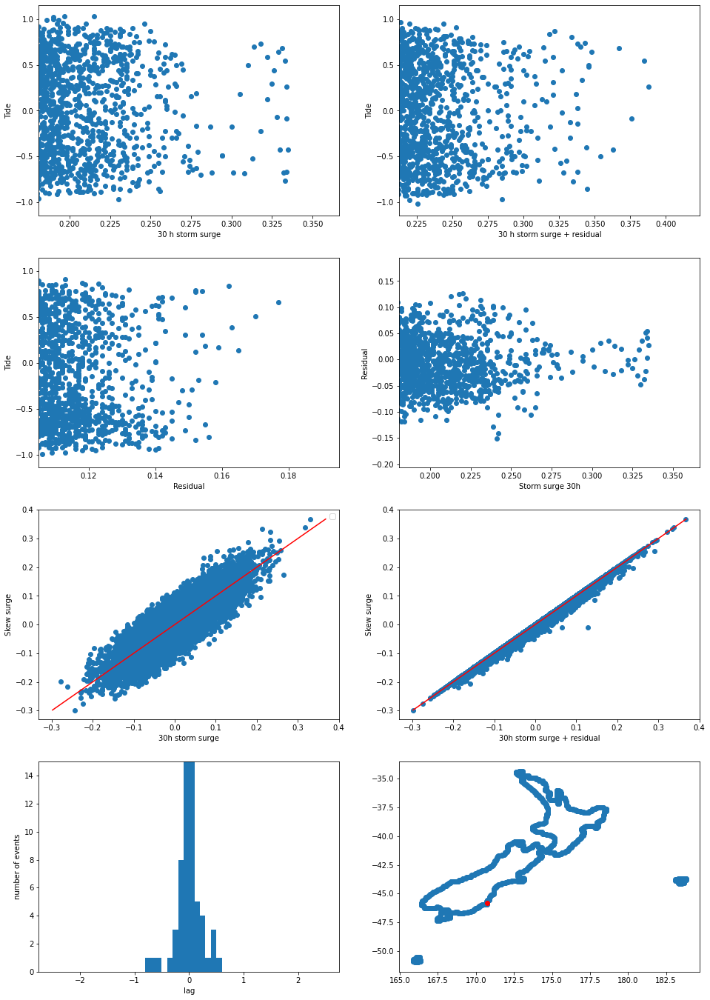

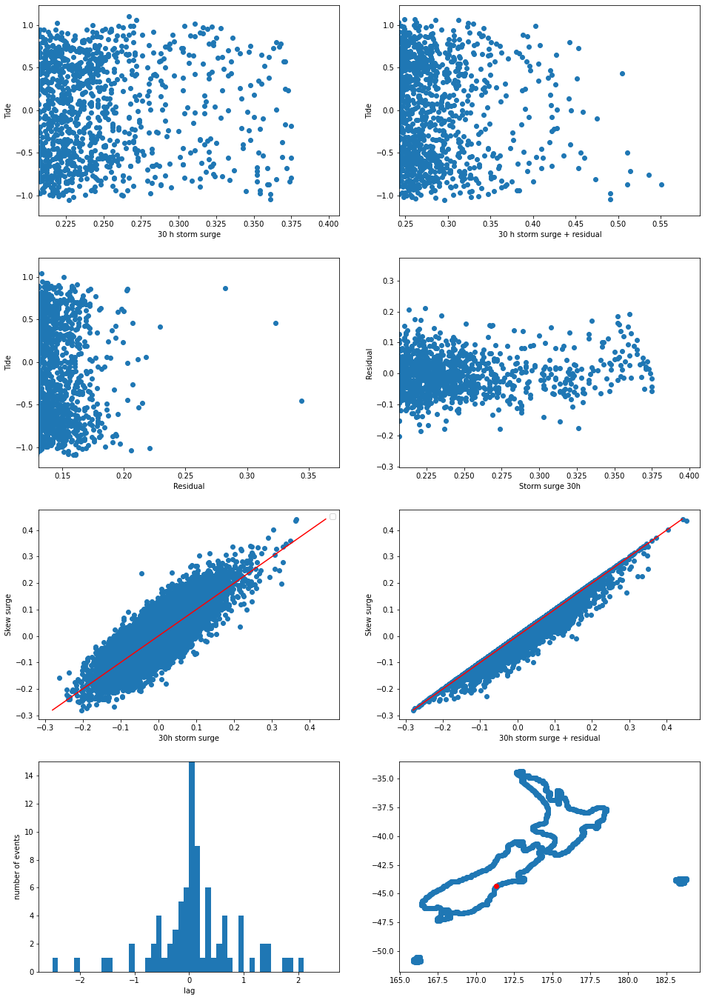

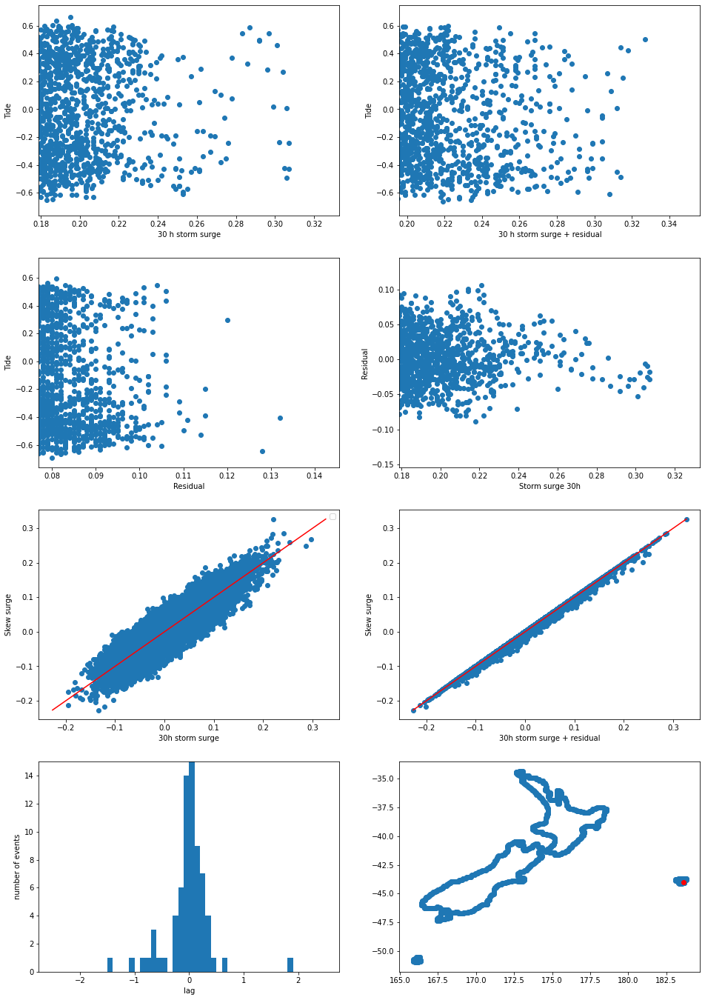

...

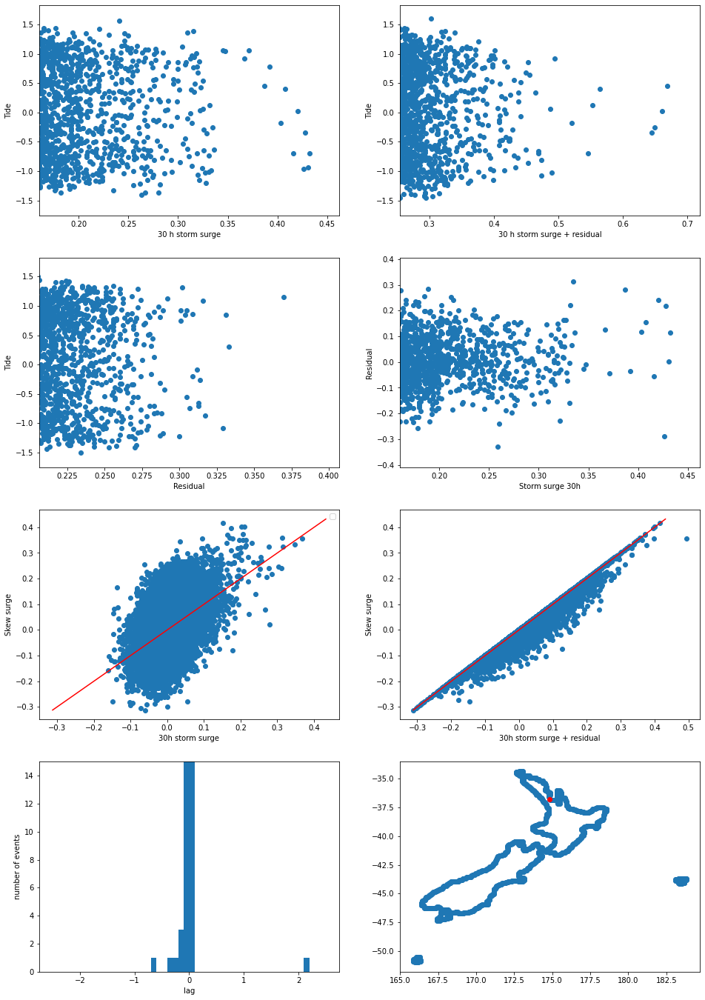

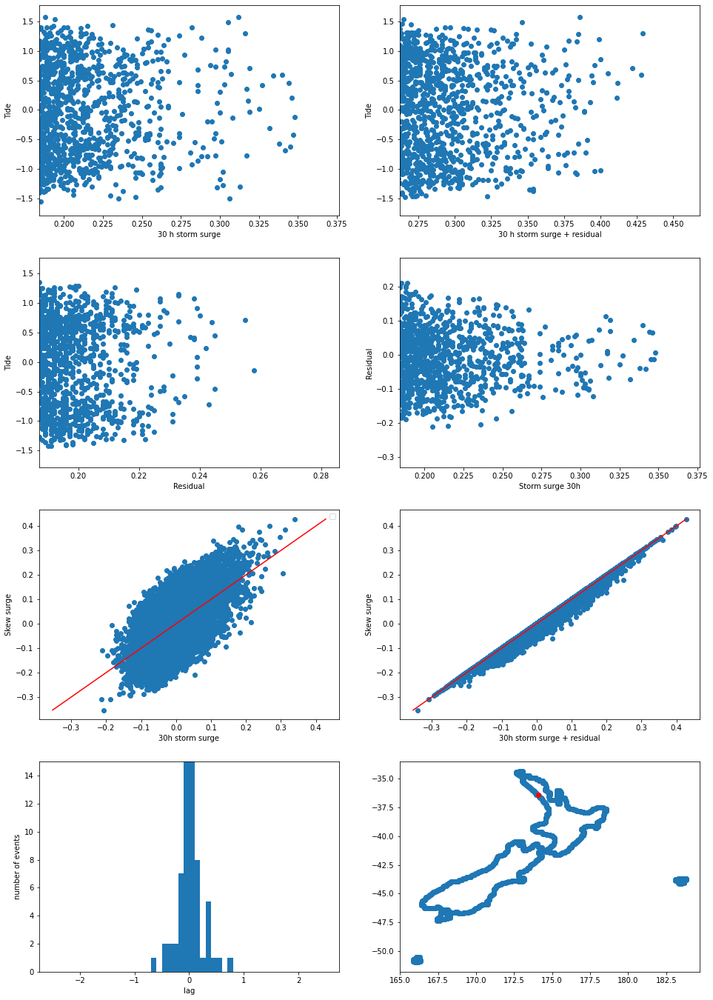

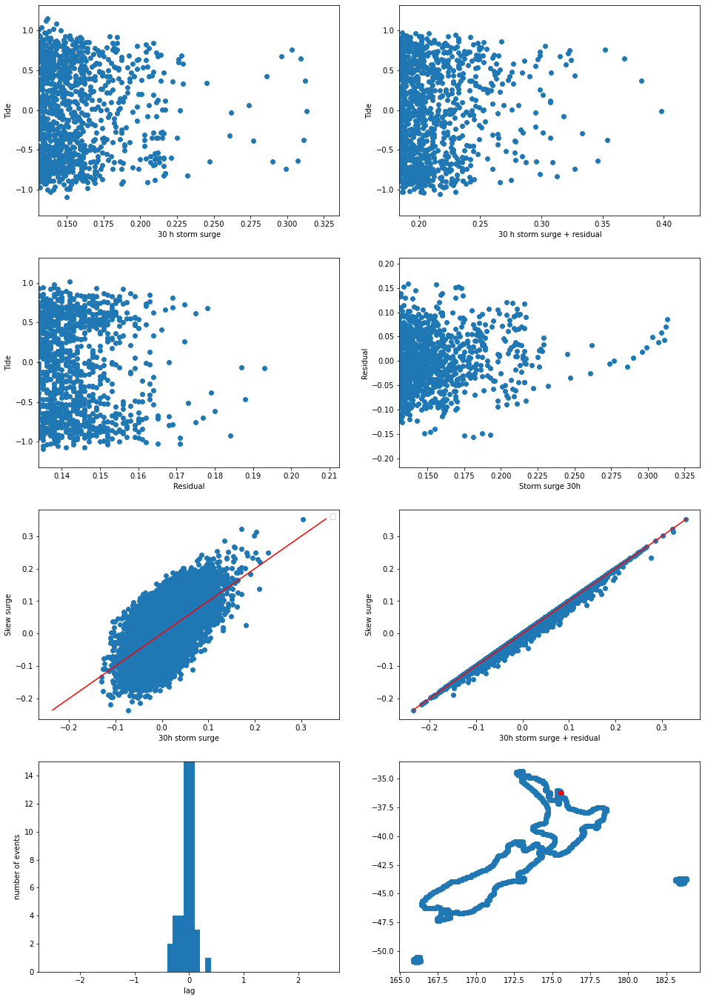

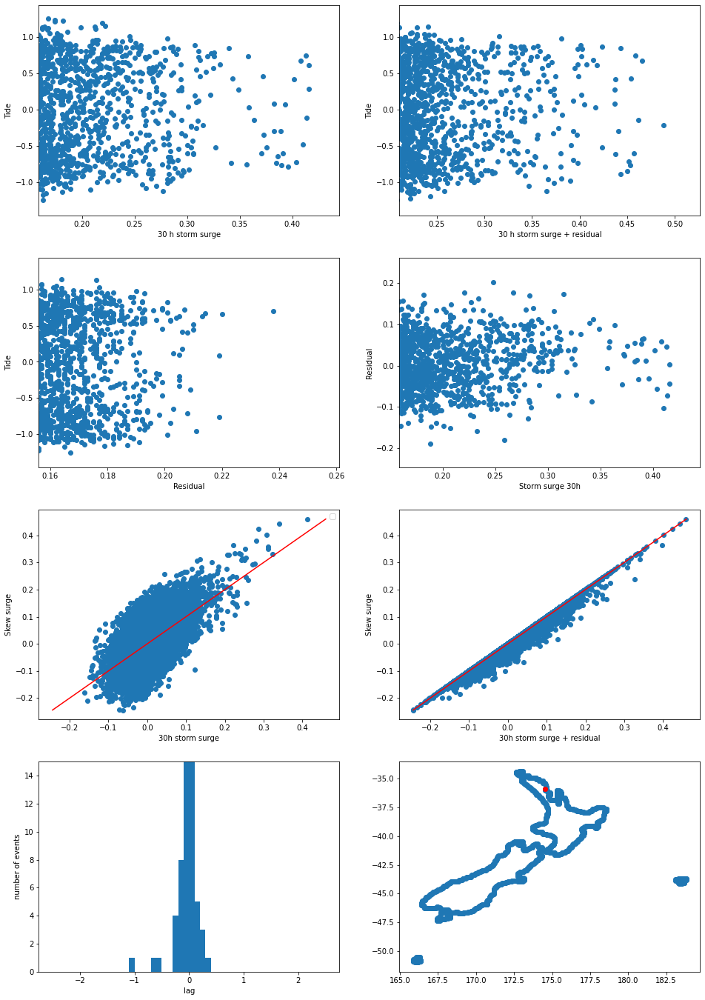

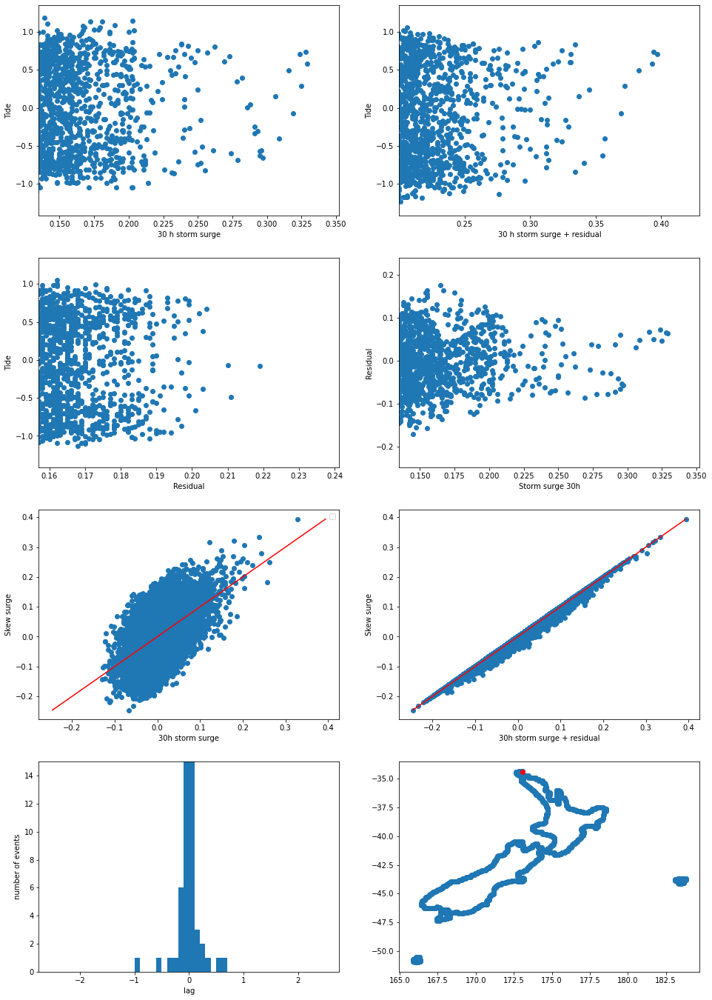

In [321]:
for site_id in javi_points:
    do_plot(data_in=data,
        site_id=site_id,#59,
        filename='/tmp/ss/poly_ss_%i.png'%(site_id))

In [ ]:
la